In [1]:
import sys
sys.path.append('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/pvc-6/pvc6_helper_modules/')

from pvc6_stim_analysis import *
from pvc6_load_data import *
from pvc6_plotting import *

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import h5py
from scipy.stats import pearsonr
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error
from spikeparam.patch.fit import Spike, SpikeGroup
from tqdm.notebook import tqdm

import seaborn as sns
sns.set(rc={'figure.figsize':(12,9)})
sns.set_style('whitegrid')
sns.set_style("whitegrid", {'axes.grid' : False})

import warnings
warnings.filterwarnings('ignore')

#### Data source: PVC-6 — exploratory pink noise analysis

An earlier exploratory notebook for cell 2 (151145.04_Data.h5), focused specifically on pink noise stimulation. This was the ground-up version of the analysis before it was formalized into `spk_waveform_stim_predictors_cell2` — useful for checking raw correlations, visualizing the stimulus spectrum, and prototyping the ridge regression framework.

In [2]:
# open and load the data

fs = 200000 # sampling rate
one_ms = int(fs / 1000)

total_sweeps = 66

# 153098_04_02_data has 0 through 66 sweeps
# 151145_04_Data  has 0 through 91 sweeps
filename = '/Users/blancamartin/Downloads/151145.04_Data.h5' # filename


# open file
f = h5py.File(filename, 'r')

# list(f.keys())

# qc_data = f['qcSweep_Key']
# qc_data[0, :, :]

#### Constant current — baseline waveform check

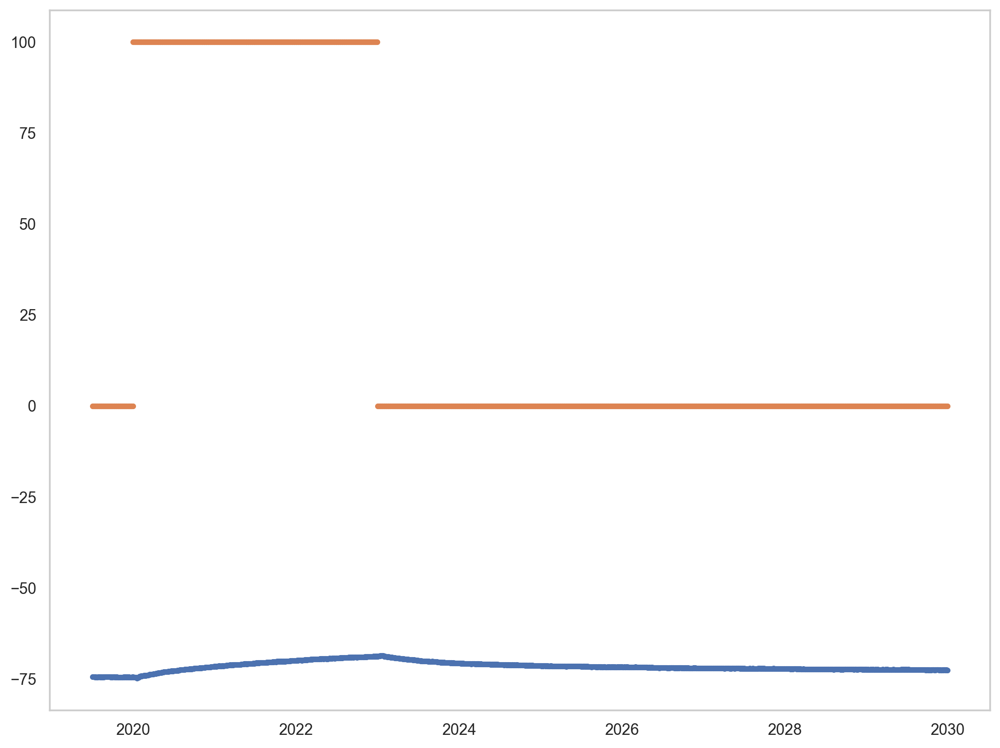

In [3]:
sweep_number = 3
index_start = 403900
index_end = 406000

dset, times = load_sweep(sweep_number, f, fs)
plot_ephys_data(dset, times, index_start, index_end)
plot_stim_data(dset, times, index_start, index_end)
plt.show()

#### Pink noise (1/f) stimulation — the key condition

The pink noise stimulus has a 1/f power spectrum — amplitude decreases with increasing frequency — mimicking natural sensory inputs. This drives variable, irregular spiking that lets us correlate spike waveform features with instantaneous stimulus statistics.

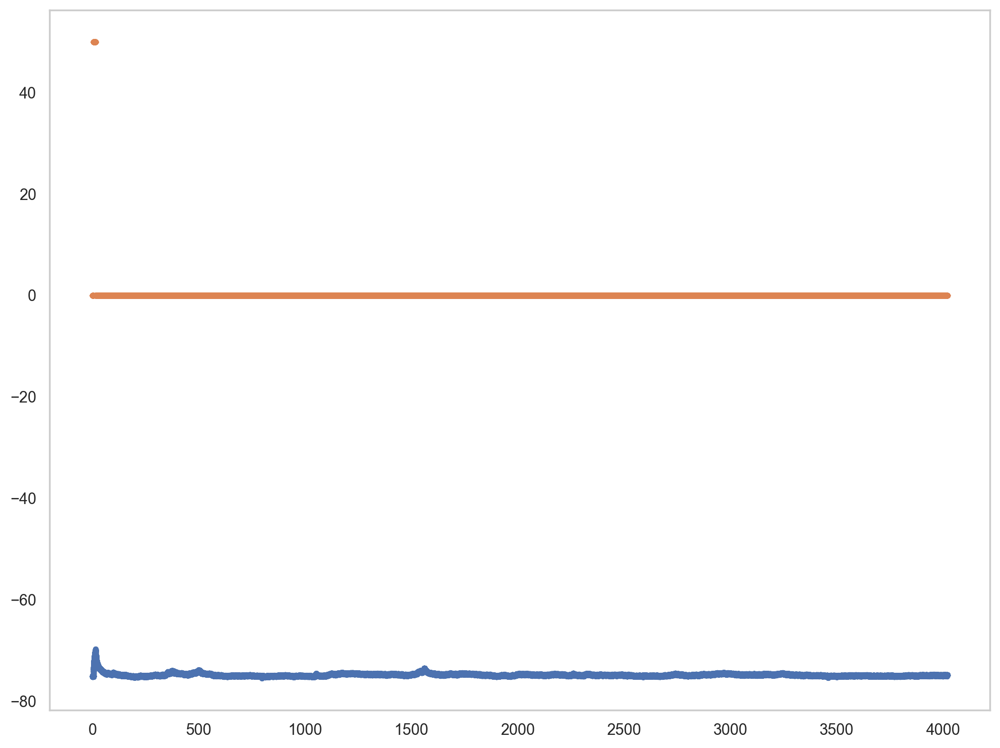

In [4]:
sweep_number = 14
index_start = 0
index_end = int(10e10)

dset, times = load_sweep(sweep_number, f, fs)
plot_ephys_data(dset, times, index_start, index_end)
plot_stim_data(dset, times, index_start, index_end)
plt.show()

#### Pink noise stimulus spectrum

We visualize the power spectrum of the pink noise waveform to confirm the expected 1/f structure and characterize any sweep-to-sweep variation in spectral properties (exponent, amplitude).

#### Gathering pink noise stimulus metadata

For each pink sweep we extract the noise statistics (exponent, mean amplitude, std) that will serve as regression targets downstream.

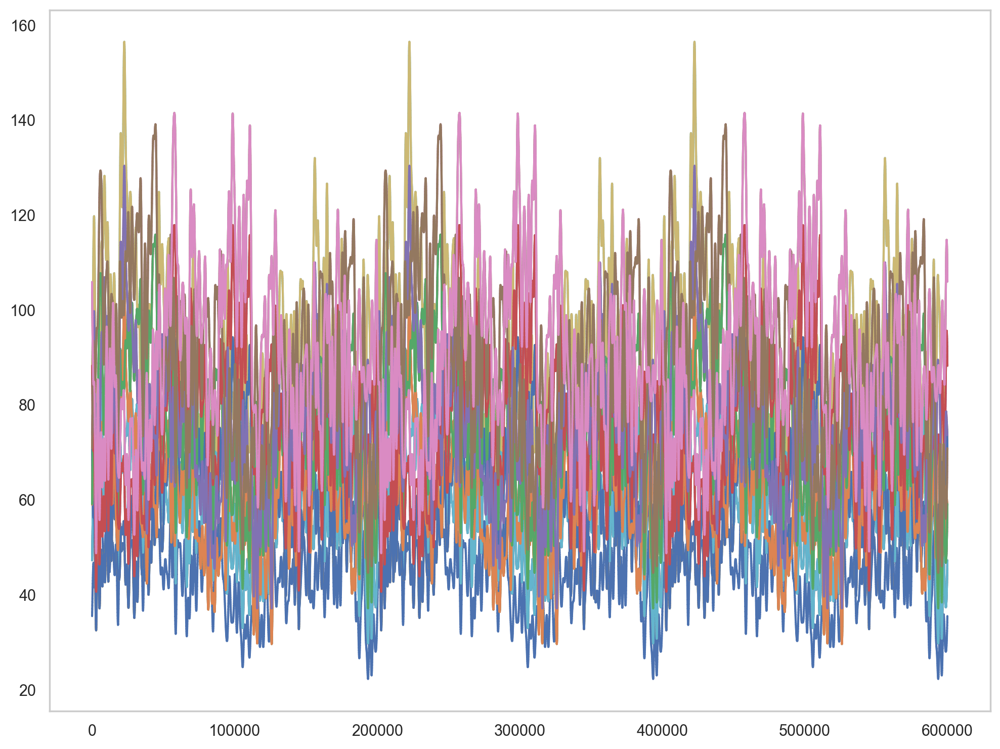

In [5]:
pink_types = process_pink_type_info(f, fs)

#### Spike detection and waveform extraction

Threshold-crossing detection across all sweeps, followed by extraction of aligned spike waveform snippets. We plot a single spike + derivative to verify that the key morphological landmarks are being identified correctly.

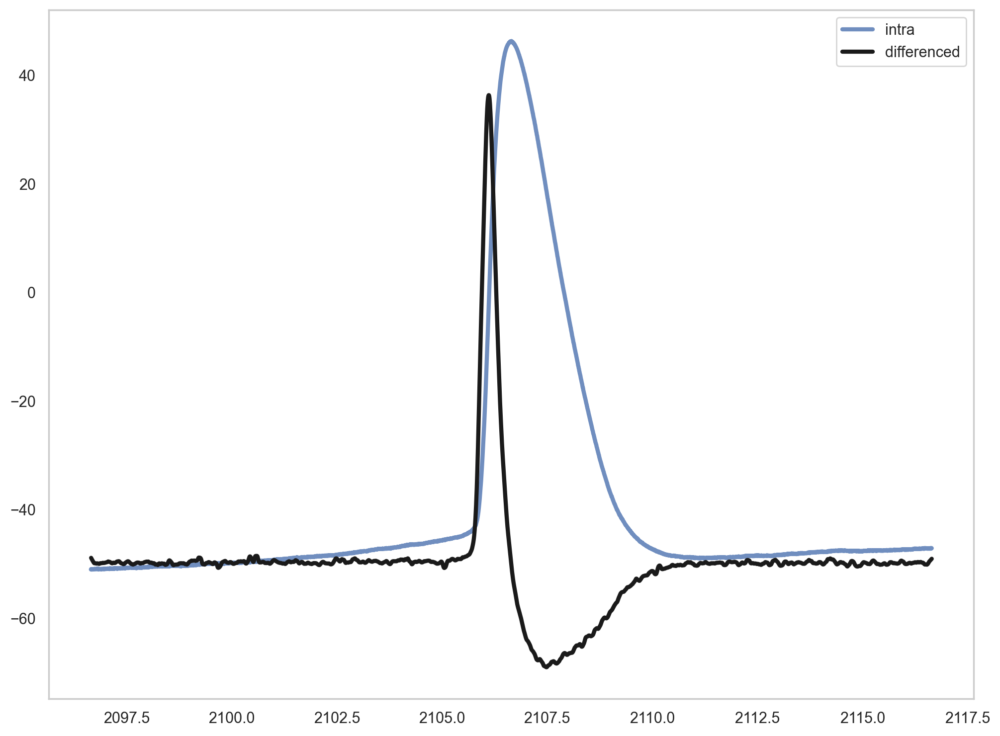

In [6]:
plot_spike_and_derivative(28, f, fs, one_ms)

#### Parameterizing the complete spike dataset

We run the `Spike` class over all detected spikes to extract the full waveform feature set. This is the same parameterization used across all spe-1 and pvc-6 analyses.

In [7]:
df_sweep, df_stim_type, df_spike_number, df_voltage_ramp, df_inflection_time, df_inflection_mv, \
df_peak_amplitude, df_peak_sharpness, df_decay_lambda, df_decay_const, df_stim_exp, df_stim_mean, \
df_stim_std, df_pinktype, all_data, all_times, all_contant_spks, all_ramp_spks, all_pink_spks = \
    process_sweeps(66, f, one_ms, fs, pink_types, load_sweep, find_spike_times, fit_exp_nonlinear)

stim_waveforms = [all_contant_spks, all_ramp_spks, all_pink_spks]

df_stim_features = pd.DataFrame(
    {'sweep': df_sweep, 'stim_type': df_stim_type, 'spike_num': df_spike_number,
     'stim_exp': df_stim_exp, 'stim_mean': df_stim_mean, 'stim_std': df_stim_std, 'pink_type': df_pinktype},
    columns=['sweep', 'stim_type', 'spike_num', 'stim_exp', 'stim_mean', 'stim_std', 'pink_type']
)

In [8]:
#try collapsing the all data array to 1d (concatenate all sweeps)
all_data_flat =  [n for one_dim in all_data for n in one_dim]

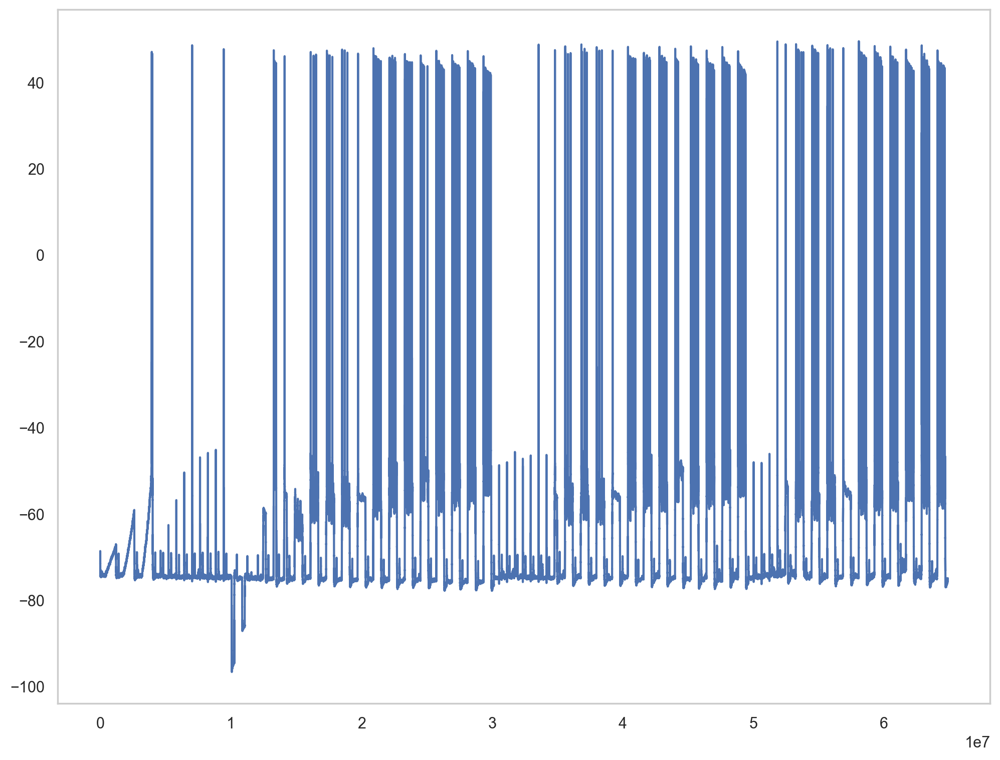

In [9]:
plt.plot(all_data_flat)


In [10]:
#recreate parameterization using the Spike class
#Run spikeparam on real IAPs |
sp = Spike(thresh_amp= -10, window_length=(5., 5.), smooth_frac=.008, pre_inflection_ms = 0.5)


sp.fit(all_data_flat, fs, n_jobs=-1, progress=tqdm)

Spike:   0%|          | 0/380 [00:00<?, ?it/s]

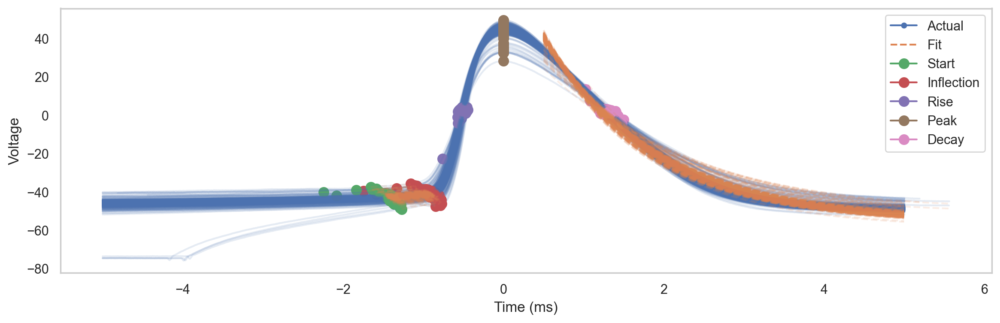

In [11]:
sp.plot(show_points=True)

In [12]:
sp.df_features

,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,isi,r_squared_ramp,r_squared_exp
0,3.595110,0.910,-40.687501,47.062501,1.770,0.781250,0.751443,-57.186790,237.710,0.920465,0.991438
1,3.635989,0.915,-40.000001,46.625001,1.800,0.781250,0.723876,-57.425108,15218.510,0.926243,0.991291
2,4.593834,0.805,-45.531251,48.593751,1.735,1.062500,0.776968,-58.690058,12092.215,0.528489,0.989599
3,-5.110936,0.845,-47.468751,47.687501,1.785,0.937500,0.772022,-58.185266,19147.480,0.532442,0.990454
4,4.664379,0.840,-42.843751,47.437501,1.755,0.937500,0.788614,-55.249580,52.710,0.959680,0.989547
...,...,...,...,...,...,...,...,...,...,...,...
375,4.415467,0.910,-40.406251,43.937501,1.815,0.875000,0.714389,-54.339506,99.475,0.957500,0.992094
376,4.070470,0.920,-40.281251,43.156251,1.825,0.859375,0.682648,-55.332400,122.850,0.965532,0.992961
377,4.634601,0.885,-41.156251,43.812501,1.820,0.812500,0.690530,-54.969858,158.875,0.955472,0.992665
378,4.482448,0.930,-39.906251,43.468751,1.845,0.734375,0.679993,-54.511635,218.945,0.946186,0.993387


In [13]:
df_features = sp.df_features

#### Merging spike features with stimulus metadata

Combine the `Spike` feature DataFrame with per-spike stimulus context (stim type, sweep, ISI, pink noise properties). The resulting table is the input for all correlation and regression analyses.

In [14]:
df = pd.concat([df_stim_features, df_features], axis=1)

In [15]:
pink_test = df.loc[df['stim_type'] == 'pink']

In [16]:
# Group by 'sweep' and use `tail(1)` to get the last entry of each group
last_spikes_indices = df.groupby('sweep').tail(1).index

# last_spikes_indices now contains the indices of the last spikes in each sweep
print("Indices of last spikes in each sweep:", last_spikes_indices)

Indices of last spikes in each sweep: Index([  1,   2,   3,  13,  14,  17,  21,  24,  25,  37,  47,  58,  65,  86,
       104, 120, 137, 138, 139, 143, 147, 150, 151, 163, 173, 184, 190, 211,
       230, 247, 267, 268, 269, 275, 281, 286, 287, 301, 314, 325, 337, 359,
       379],
      dtype='int64')


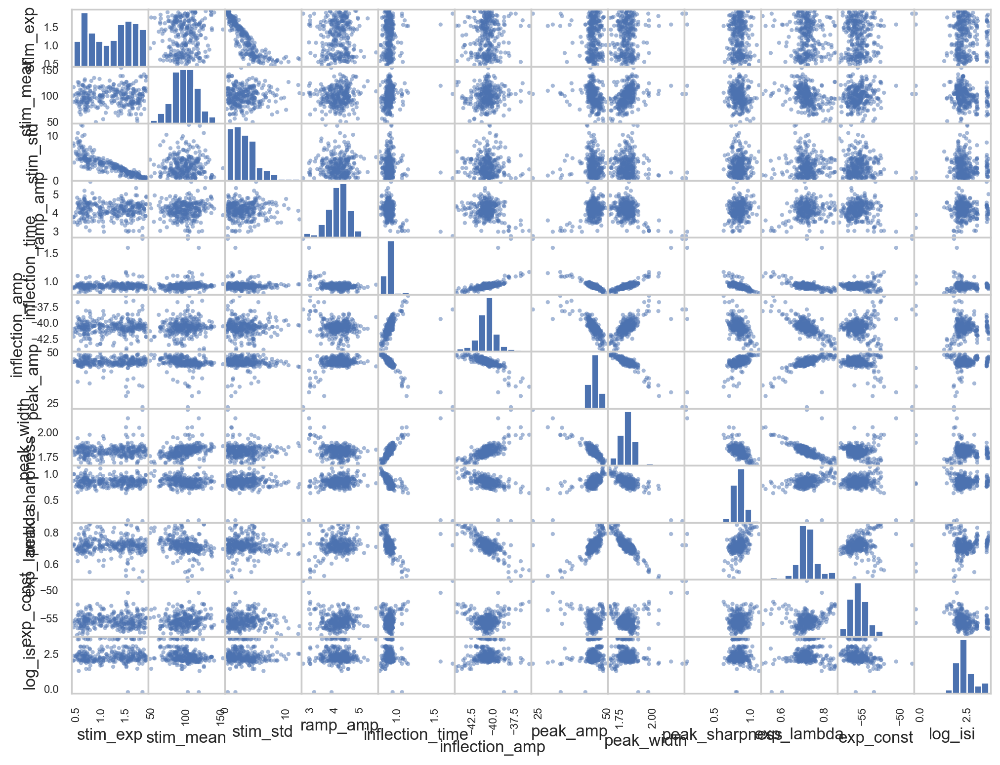

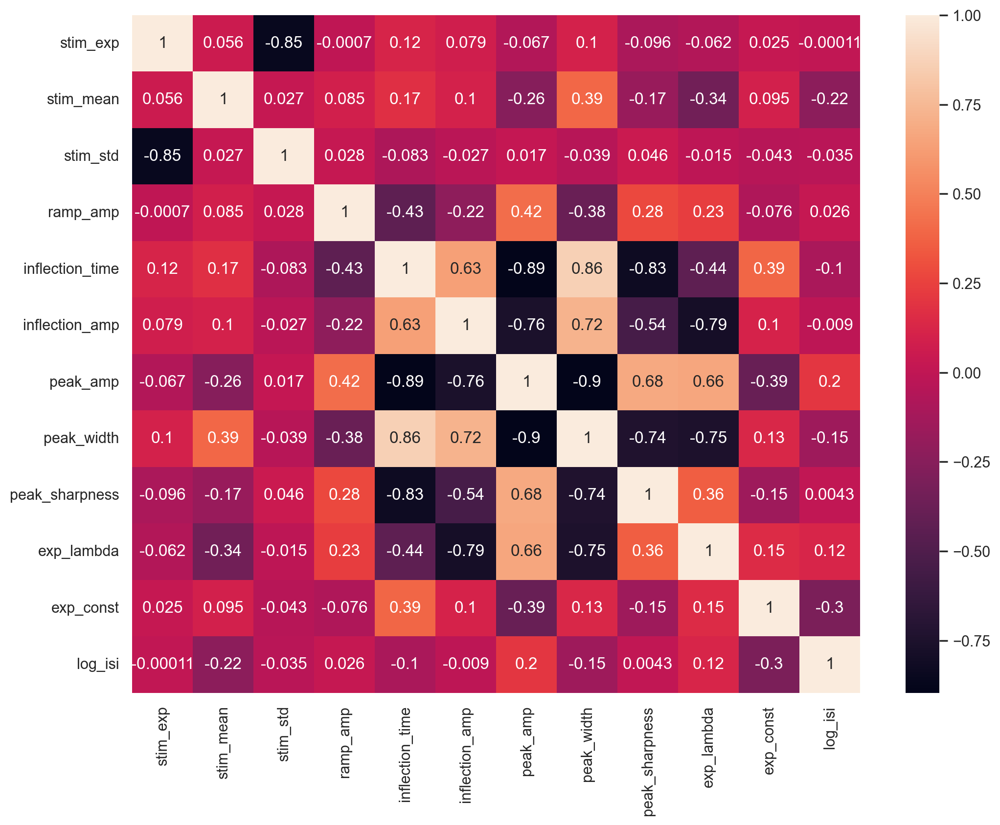

,stim_exp,stim_mean,stim_std,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,log_isi
stim_exp,1.0***,0.06,-0.85***,-0.0,0.12*,0.08,-0.07,0.1,-0.1,-0.06,0.02,-0.0
stim_mean,0.06,1.0***,0.03,0.09,0.17**,0.1,-0.26***,0.39***,-0.17**,-0.34***,0.09,-0.22***
stim_std,-0.85***,0.03,1.0***,0.03,-0.08,-0.03,0.02,-0.04,0.05,-0.01,-0.04,-0.03
ramp_amp,-0.0,0.09,0.03,1.0***,-0.43***,-0.22***,0.42***,-0.38***,0.28***,0.23***,-0.08,0.03
inflection_time,0.12*,0.17**,-0.08,-0.43***,1.0***,0.63***,-0.89***,0.86***,-0.83***,-0.44***,0.39***,-0.1
inflection_amp,0.08,0.1,-0.03,-0.22***,0.63***,1.0***,-0.76***,0.72***,-0.54***,-0.79***,0.1,-0.01
peak_amp,-0.07,-0.26***,0.02,0.42***,-0.89***,-0.76***,1.0***,-0.9***,0.68***,0.66***,-0.39***,0.2***
peak_width,0.1,0.39***,-0.04,-0.38***,0.86***,0.72***,-0.9***,1.0***,-0.74***,-0.75***,0.13*,-0.15**
peak_sharpness,-0.1,-0.17**,0.05,0.28***,-0.83***,-0.54***,0.68***,-0.74***,1.0***,0.36***,-0.15**,0.0
exp_lambda,-0.06,-0.34***,-0.01,0.23***,-0.44***,-0.79***,0.66***,-0.75***,0.36***,1.0***,0.15**,0.12*


In [17]:
# Filtering criteria
df = df.loc[df['inflection_time'] > 0.]
df = df.loc[df['inflection_time'] < 2.]
df = df.loc[df['r_squared_exp'] >= 0.5]
df = df.loc[df['r_squared_ramp'] >= 0.1]

# Convert ISIs to logarithmic scale and rename the column
df[['isi']] = np.log10(df[['isi']])
df.rename(columns={'isi':'log_isi'}, inplace=True)

# Drop columns that are no longer needed for quality control
df = df.drop(['r_squared_exp', 'r_squared_ramp'], axis=1)

# Drop rows with any NaN values across the DataFrame
df.dropna(inplace=True)


df_all = df.drop(['sweep', 'stim_type', 'pink_type', 'spike_num'], axis=1)

pd.plotting.scatter_matrix(df_all, alpha=0.5)
plt.show()

spikes_corr = df_all.corr()
# plot the heatmap and annotation on it
sns.heatmap(spikes_corr, xticklabels=spikes_corr.columns, yticklabels=spikes_corr.columns, annot=True)
plt.show()

rho = df_all.corr()
pval = df_all.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
p = pval.map(lambda x: ''.join(['*' for t in [0.001,0.01,0.05] if x<=t]))
rho.round(2).astype(str) + p

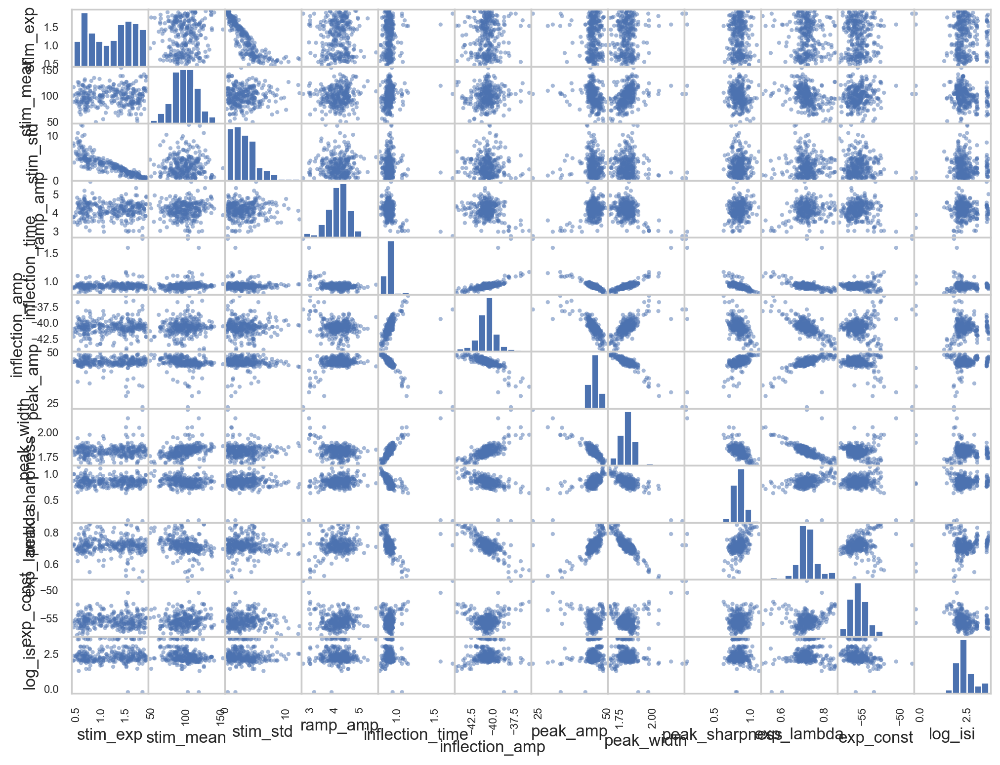

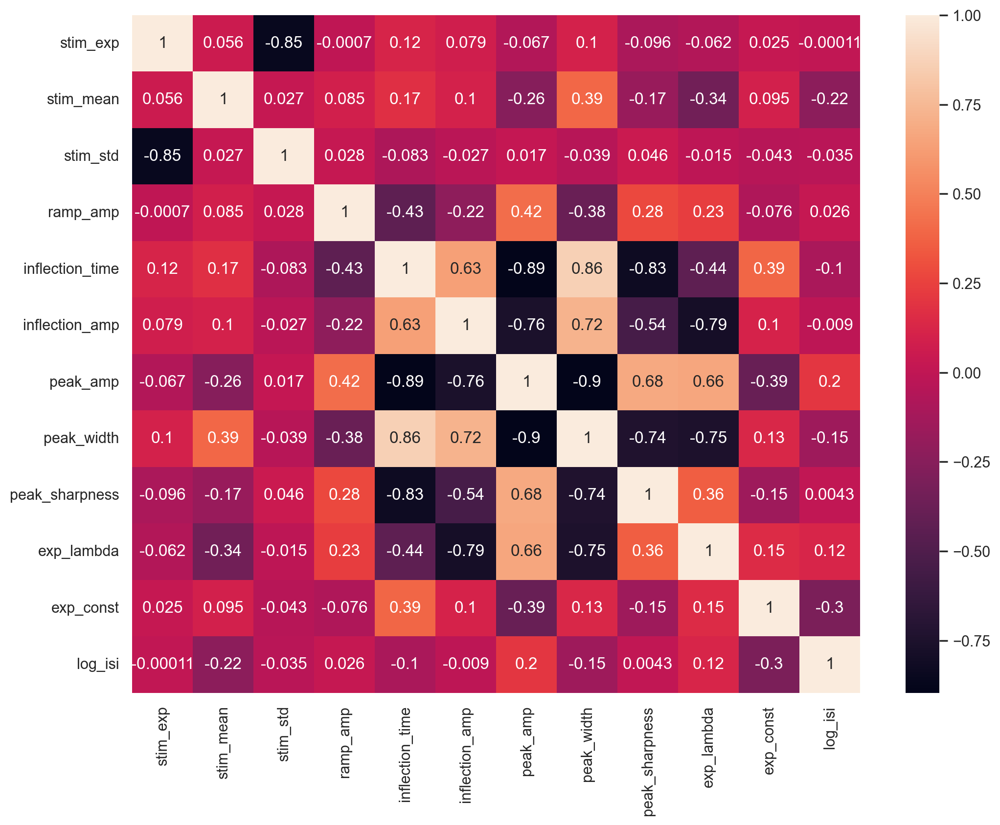

,stim_exp,stim_mean,stim_std,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,log_isi
stim_exp,1.0***,0.06,-0.85***,-0.0,0.12*,0.08,-0.07,0.1,-0.1,-0.06,0.02,-0.0
stim_mean,0.06,1.0***,0.03,0.09,0.17**,0.1,-0.26***,0.39***,-0.17**,-0.34***,0.09,-0.22***
stim_std,-0.85***,0.03,1.0***,0.03,-0.08,-0.03,0.02,-0.04,0.05,-0.01,-0.04,-0.03
ramp_amp,-0.0,0.09,0.03,1.0***,-0.43***,-0.22***,0.42***,-0.38***,0.28***,0.23***,-0.08,0.03
inflection_time,0.12*,0.17**,-0.08,-0.43***,1.0***,0.63***,-0.89***,0.86***,-0.83***,-0.44***,0.39***,-0.1
inflection_amp,0.08,0.1,-0.03,-0.22***,0.63***,1.0***,-0.76***,0.72***,-0.54***,-0.79***,0.1,-0.01
peak_amp,-0.07,-0.26***,0.02,0.42***,-0.89***,-0.76***,1.0***,-0.9***,0.68***,0.66***,-0.39***,0.2***
peak_width,0.1,0.39***,-0.04,-0.38***,0.86***,0.72***,-0.9***,1.0***,-0.74***,-0.75***,0.13*,-0.15**
peak_sharpness,-0.1,-0.17**,0.05,0.28***,-0.83***,-0.54***,0.68***,-0.74***,1.0***,0.36***,-0.15**,0.0
exp_lambda,-0.06,-0.34***,-0.01,0.23***,-0.44***,-0.79***,0.66***,-0.75***,0.36***,1.0***,0.15**,0.12*


In [18]:
df_pink = df.loc[df['stim_type'] == 'pink']
df_pink = df_pink.drop(['sweep', 'stim_type', 'pink_type', 'spike_num'], axis=1)

pd.plotting.scatter_matrix(df_pink, alpha=0.5)
plt.show()

spikes_corr = df_pink.corr()
# plot the heatmap and annotation on it
sns.heatmap(spikes_corr, xticklabels=spikes_corr.columns, yticklabels=spikes_corr.columns, annot=True)
plt.show()

rho = df_pink.corr()
pval = df_pink.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
p = pval.map(lambda x: ''.join(['*' for t in [0.001,0.01,0.05] if x<=t]))
rho.round(2).astype(str) + p

#### First-spike-only analysis — minimizing spike adaptation

We isolate the first spike of each pink sweep to remove adaptation effects. Inter-spike interval history and firing rate adaptation can both influence waveform shape independently of the input — first spikes give the cleanest readout of how the stimulus itself shapes waveform morphology.

#### Only look at first spike to minimize adaptations etc. effects

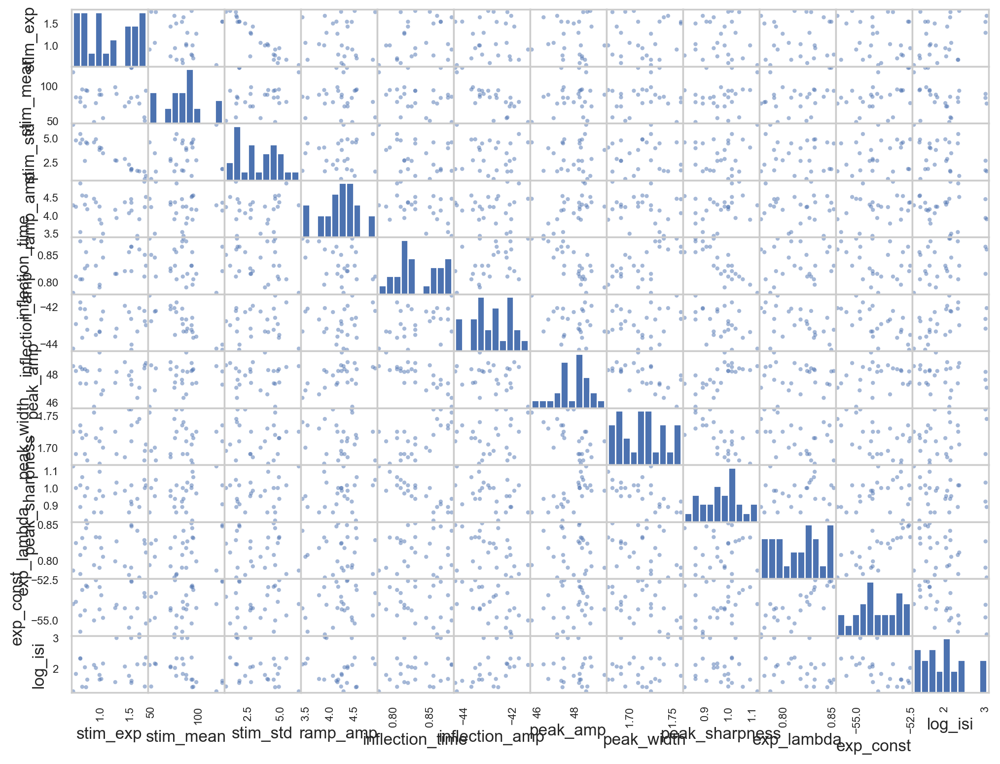

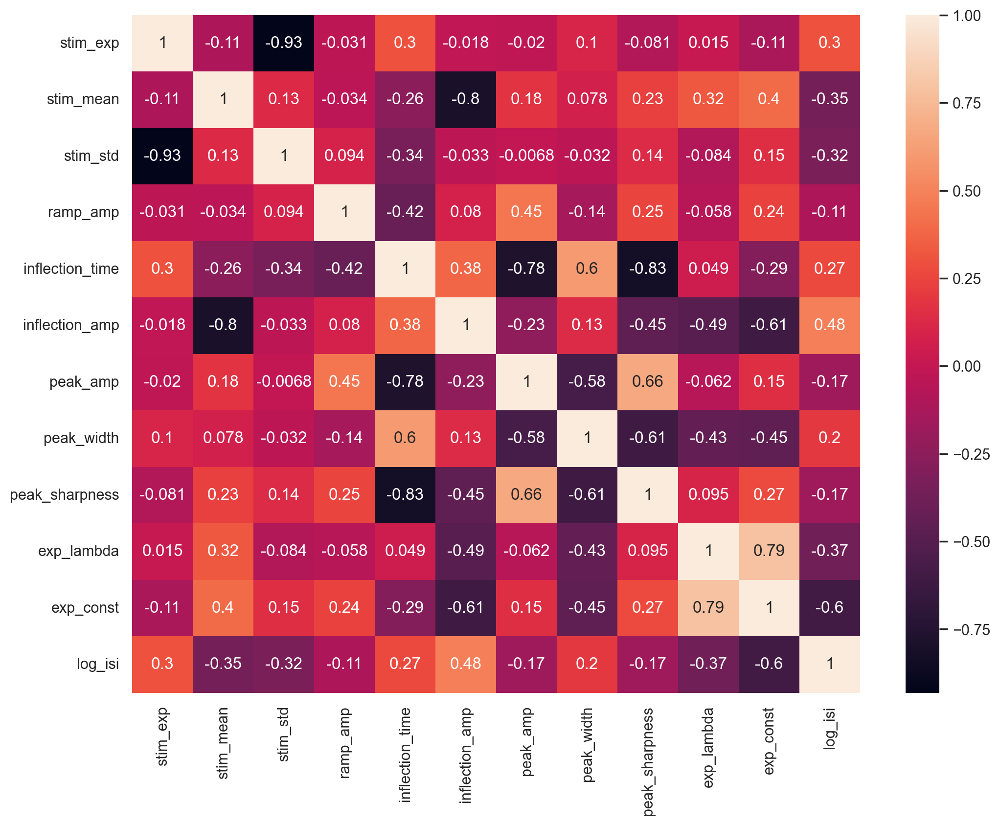

,stim_exp,stim_mean,stim_std,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,log_isi
stim_exp,1.0***,-0.11,-0.93***,-0.03,0.3,-0.02,-0.02,0.1,-0.08,0.01,-0.11,0.3
stim_mean,-0.11,1.0***,0.13,-0.03,-0.26,-0.8***,0.18,0.08,0.23,0.32,0.4*,-0.35
stim_std,-0.93***,0.13,1.0***,0.09,-0.34,-0.03,-0.01,-0.03,0.14,-0.08,0.15,-0.32
ramp_amp,-0.03,-0.03,0.09,1.0***,-0.42*,0.08,0.45*,-0.14,0.25,-0.06,0.24,-0.11
inflection_time,0.3,-0.26,-0.34,-0.42*,1.0***,0.38,-0.78***,0.6**,-0.83***,0.05,-0.29,0.27
inflection_amp,-0.02,-0.8***,-0.03,0.08,0.38,1.0***,-0.23,0.13,-0.45*,-0.49*,-0.61***,0.48*
peak_amp,-0.02,0.18,-0.01,0.45*,-0.78***,-0.23,1.0***,-0.58**,0.66***,-0.06,0.15,-0.17
peak_width,0.1,0.08,-0.03,-0.14,0.6**,0.13,-0.58**,1.0***,-0.61***,-0.43*,-0.45*,0.2
peak_sharpness,-0.08,0.23,0.14,0.25,-0.83***,-0.45*,0.66***,-0.61***,1.0***,0.1,0.27,-0.17
exp_lambda,0.01,0.32,-0.08,-0.06,0.05,-0.49*,-0.06,-0.43*,0.1,1.0***,0.79***,-0.37


In [19]:
df_pink_first = df.loc[df['stim_type'] == 'pink']
df_pink_first = df_pink_first.loc[df['spike_num'] == 0]
df_pink_first = df_pink_first.drop(['sweep', 'stim_type', 'spike_num', 'pink_type',], axis=1)

pd.plotting.scatter_matrix(df_pink_first, alpha=0.5)
plt.show()

spikes_corr = df_pink_first.corr()
# plot the heatmap and annotation on it
sns.heatmap(spikes_corr, xticklabels=spikes_corr.columns, yticklabels=spikes_corr.columns, annot=True)
plt.show()

rho =df_pink_first.corr()
pval = df_pink_first.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
p = pval.map(lambda x: ''.join(['*' for t in [0.001,0.01,0.05] if x<=t]))
rho.round(2).astype(str) + p

#### Log ISI as a target variable

Log ISI is our primary readout of instantaneous firing rate / neural drive. We visualize its distribution across pink noise spikes before building predictors — checking for outliers and confirming the log transform produces an approximately normal distribution suitable for linear regression.

#### On all spikes

(array([  2.,   0.,   0.,   1.,   9.,  71., 123.,  46.,  18.,  25.]),
 array([-0.25570702,  0.13165217,  0.51901135,  0.90637053,  1.29372972,
         1.6810889 ,  2.06844808,  2.45580726,  2.84316645,  3.23052563,
         3.61788481]),
 <BarContainer object of 10 artists>)

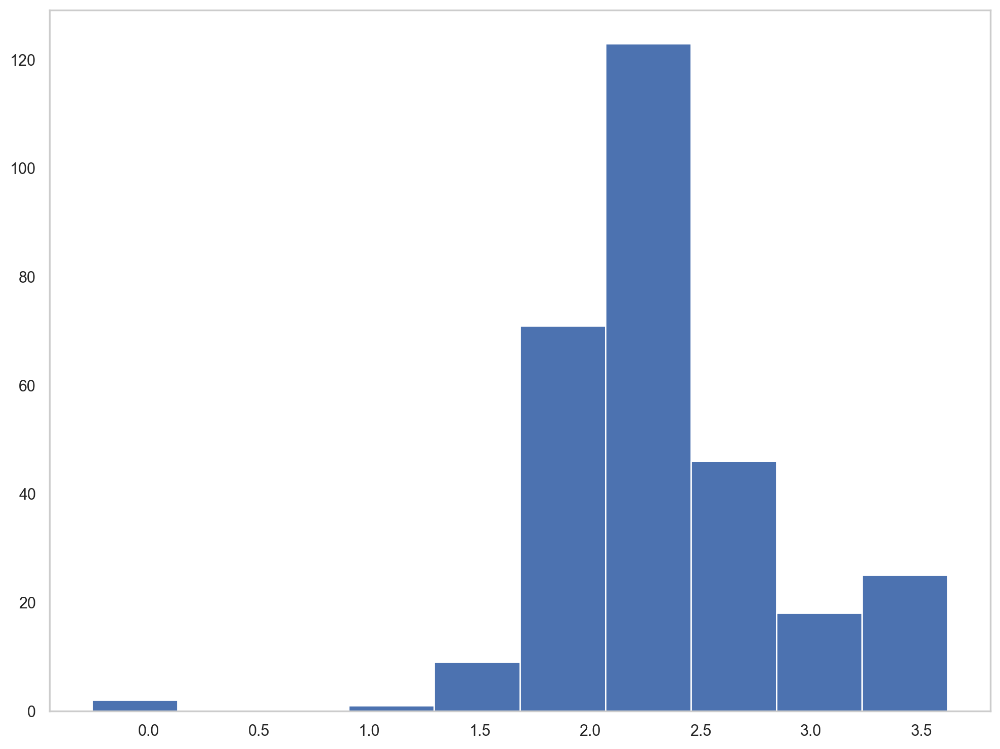

In [20]:
plt.hist(df_pink['log_isi'])

#### Removing last-spike-of-sweep artifacts

The final spike of each sweep has no successor, so its ISI is undefined / artificially large. We drop these before building ISI predictors.

In [21]:
# Find which indices are actually present in df_pink
valid_indices = [idx for idx in last_spikes_indices if idx in df_pink.index]

# Drop the last spikes
df_pink_filtered = df_pink.drop(valid_indices)

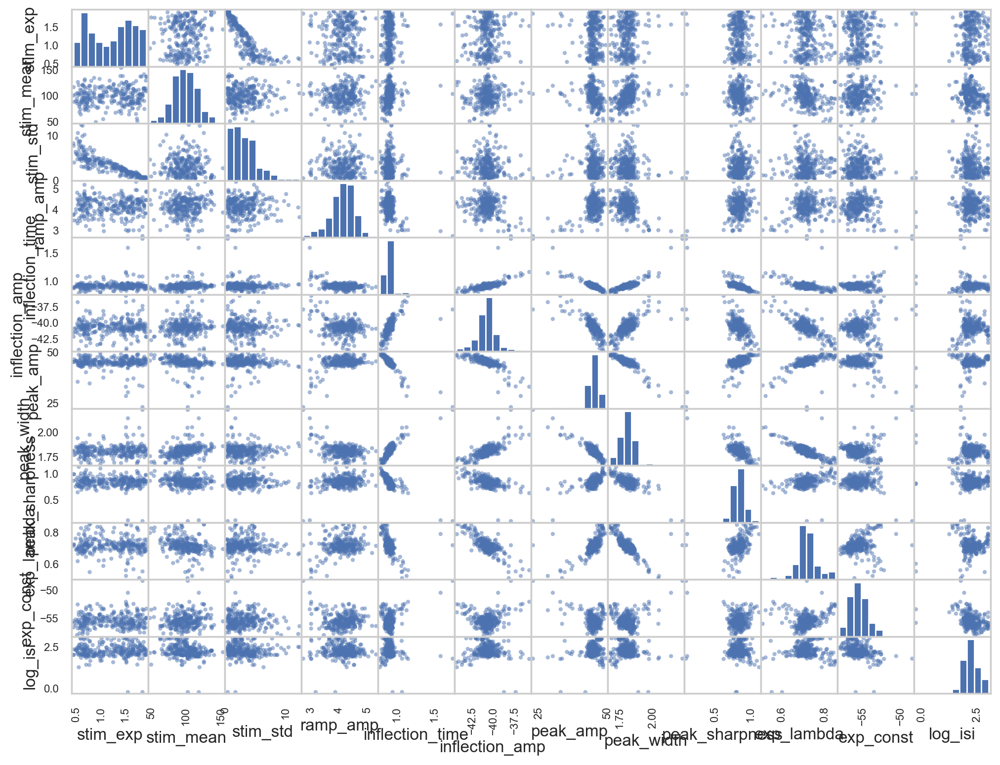

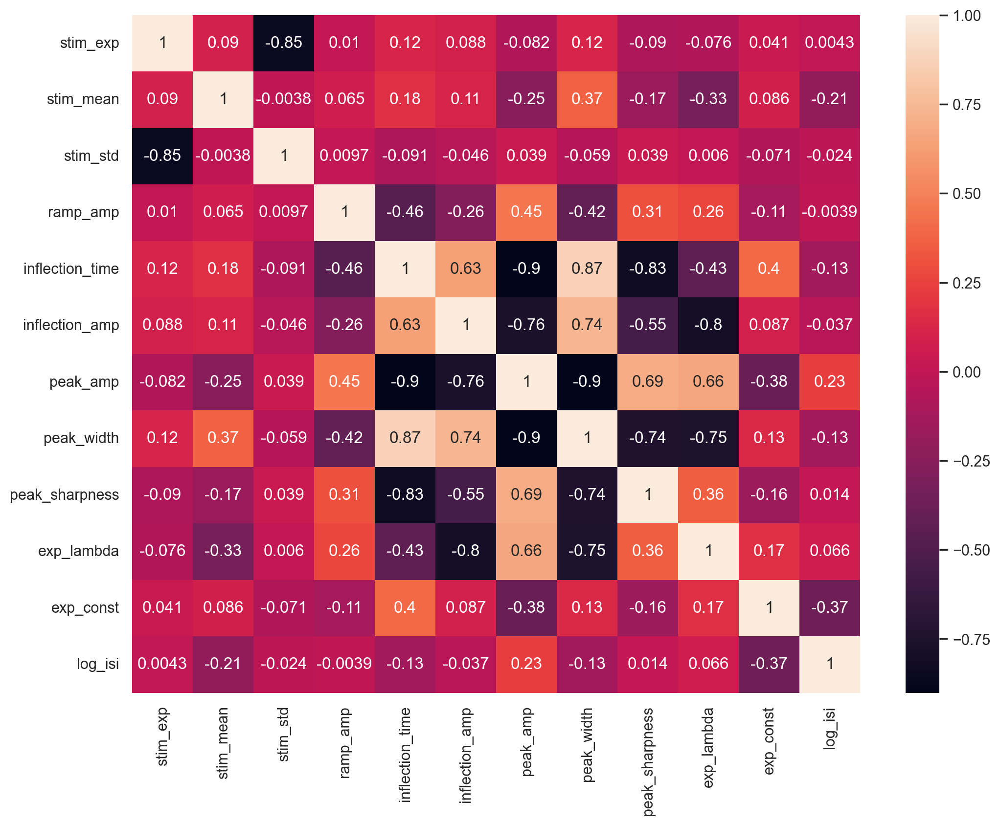

,stim_exp,stim_mean,stim_std,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,log_isi
stim_exp,1.0***,0.09,-0.85***,0.01,0.12*,0.09,-0.08,0.12*,-0.09,-0.08,0.04,0.0
stim_mean,0.09,1.0***,-0.0,0.06,0.18**,0.11,-0.25***,0.37***,-0.17**,-0.33***,0.09,-0.21***
stim_std,-0.85***,-0.0,1.0***,0.01,-0.09,-0.05,0.04,-0.06,0.04,0.01,-0.07,-0.02
ramp_amp,0.01,0.06,0.01,1.0***,-0.46***,-0.26***,0.45***,-0.42***,0.31***,0.26***,-0.11,-0.0
inflection_time,0.12*,0.18**,-0.09,-0.46***,1.0***,0.63***,-0.9***,0.87***,-0.83***,-0.43***,0.4***,-0.13*
inflection_amp,0.09,0.11,-0.05,-0.26***,0.63***,1.0***,-0.76***,0.74***,-0.55***,-0.8***,0.09,-0.04
peak_amp,-0.08,-0.25***,0.04,0.45***,-0.9***,-0.76***,1.0***,-0.9***,0.69***,0.66***,-0.38***,0.23***
peak_width,0.12*,0.37***,-0.06,-0.42***,0.87***,0.74***,-0.9***,1.0***,-0.74***,-0.75***,0.13*,-0.13*
peak_sharpness,-0.09,-0.17**,0.04,0.31***,-0.83***,-0.55***,0.69***,-0.74***,1.0***,0.36***,-0.16**,0.01
exp_lambda,-0.08,-0.33***,0.01,0.26***,-0.43***,-0.8***,0.66***,-0.75***,0.36***,1.0***,0.17**,0.07


In [22]:
pd.plotting.scatter_matrix(df_pink_filtered, alpha=0.5)
plt.show()

spikes_corr = df_pink_filtered.corr()
sns.heatmap(spikes_corr, xticklabels=spikes_corr.columns, yticklabels=spikes_corr.columns, annot=True)
plt.show()

rho = df_pink_filtered.corr()
pval = df_pink_filtered.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
p = pval.map(lambda x: ''.join(['*' for t in [0.001,0.01,0.05] if x<=t]))
rho.round(2).astype(str) + p

In [23]:
#get dfs for regression models 

df_pink_no_stim_filtered = df_pink_filtered.drop(['stim_exp', 'stim_mean', 'stim_std' ], axis=1)
df_pink_no_stim_first = df_pink_first.drop(['stim_exp', 'stim_mean', 'stim_std' ], axis=1)
df_pink_onlystim_filtered = df_pink_filtered.drop(['ramp_amp', 'inflection_time', 'inflection_amp', 'peak_amp', 'peak_width','peak_sharpness', 'exp_lambda', 'exp_const' ], axis=1)
df_pink_onlystim_first = df_pink_first.drop(['ramp_amp', 'inflection_time', 'inflection_amp', 'peak_amp', 'peak_width','peak_sharpness', 'exp_lambda', 'exp_const' ], axis=1)


#### Pairwise correlation scatter matrix — pink spikes

Scatter matrix across all spike + stimulus features for the filtered pink spike population. The goal: identify which waveform features most strongly co-vary with stimulus statistics and ISI, motivating the feature selection for the regression models.

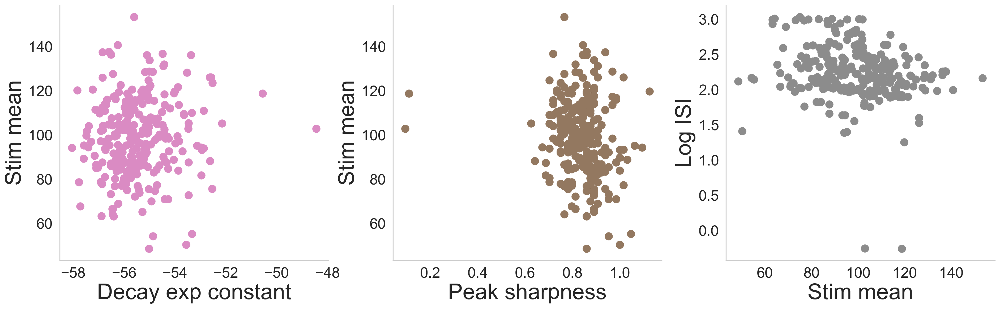

In [24]:
plot_correlation_scatter(df_pink_filtered)

#### Pink spike waveform gallery (for figure panel)

In [25]:
pink_spikes = df[df['stim_type'] == 'pink']

# Get the indices to plot
indices_to_plot = pink_spikes.index.tolist()

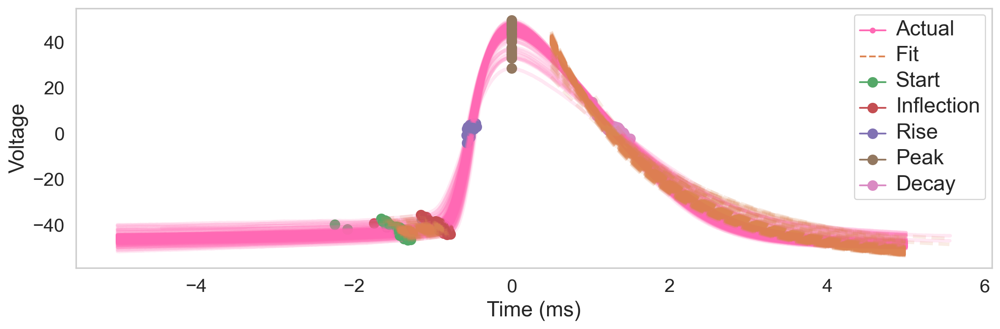

In [26]:
plot_pink_spikes(sp, indices_to_plot)

In [27]:
print(len(df_pink_filtered))

270


#### Ridge regression: predicting pink noise stimulus mean from all features

We first test the simplest regression target — stimulus mean amplitude — as a proof-of-concept that spike features carry extractable information about the input. k-fold cross-validated R² is our performance metric throughout.

In [28]:
ridge_results_dict = {}

for stim_feature in ['stim_exp', 'stim_mean', 'stim_std']:
    print(f"\n--- Processing {stim_feature} ---\n")
    data = df_pink.dropna(subset=[stim_feature])
    X = data.drop(columns=['stim_exp', 'stim_mean', 'stim_std'])
    y = data[stim_feature]
    ridge_results_dict[stim_feature] = run_ridge_regression_kfold(X, y)
    print(f"Mean R² for {stim_feature}: {ridge_results_dict[stim_feature]['r2_mean']:.3f}")


--- Processing stim_exp ---

Cross-validated R-squared scores: [-0.26452751 -0.07331423 -0.01230132 -0.05901589 -0.14114276]
Average R-squared: -0.110 ± 0.088
Adjusted R-squared scores: [-0.30445996 -0.10720837 -0.04426873 -0.09245849 -0.17717885]
Average Adjusted R-squared: -0.145 ± 0.090
Mean R² for stim_exp: 0.039

--- Processing stim_mean ---

Cross-validated R-squared scores: [-0.19109028  0.22597503  0.30086568  0.14823956  0.30704609]
Average R-squared: 0.158 ± 0.184
Adjusted R-squared scores: [-0.22870366  0.20153213  0.27878775  0.12134186  0.28516334]
Average Adjusted R-squared: 0.132 ± 0.190
Mean R² for stim_mean: 0.276

--- Processing stim_std ---

Cross-validated R-squared scores: [-0.27015133 -0.05280818 -0.01965918 -0.09319762 -0.10696283]
Average R-squared: -0.109 ± 0.086
Adjusted R-squared scores: [-0.31026137 -0.08605476 -0.05185894 -0.12771965 -0.14191956]
Average Adjusted R-squared: -0.144 ± 0.089
Mean R² for stim_std: 0.037


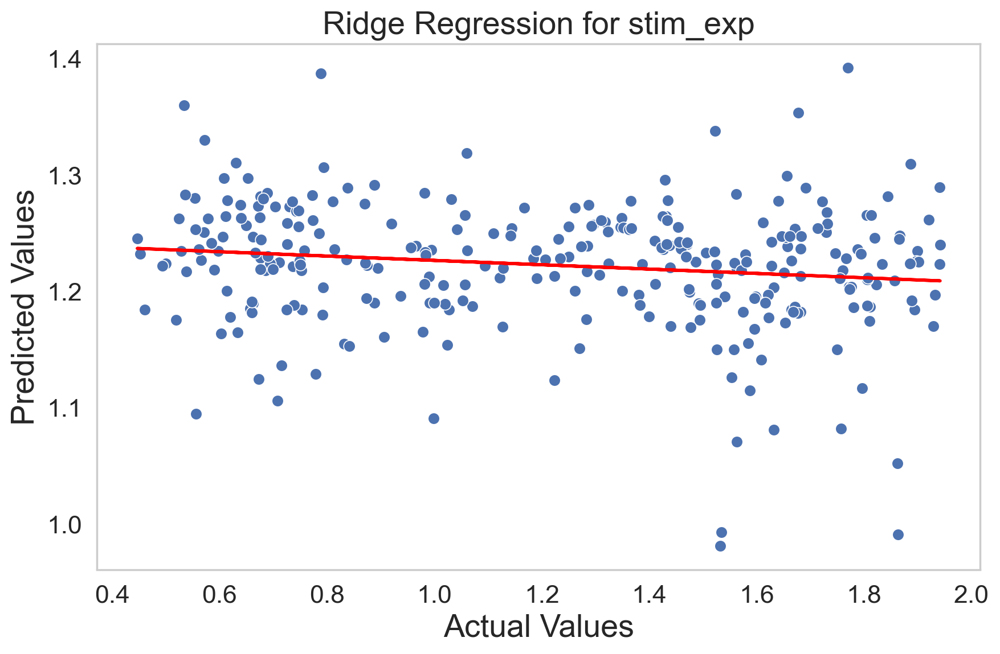

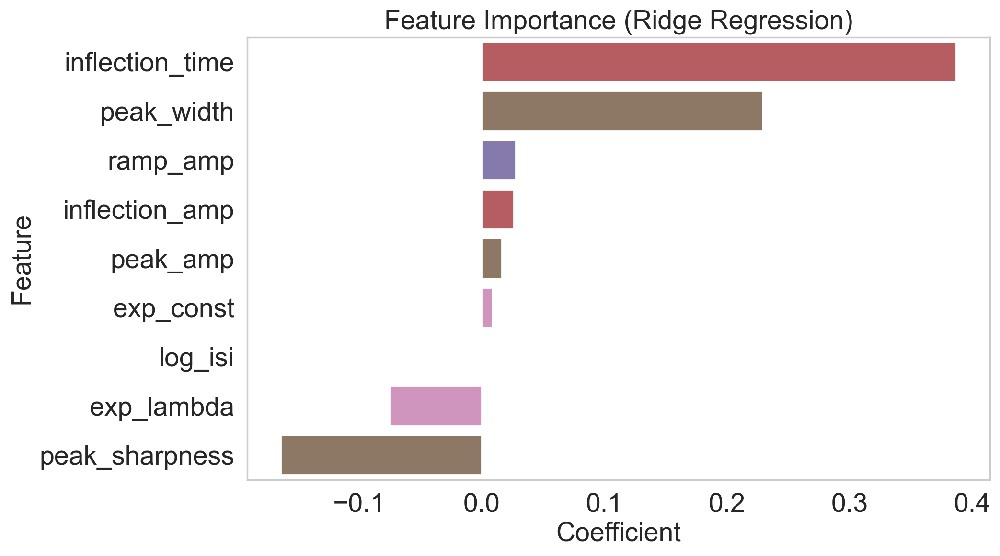


Significant Features (p < 0.05):
           Feature  Coefficient  CI Lower  CI Upper        p-value
1  inflection_time     0.386749  0.081003  0.677218   0.000000e+00
4       peak_width     0.228869 -0.030408  0.536607  4.801926e-289
0         ramp_amp     0.027602 -0.094055  0.151578   1.377790e-47
2   inflection_amp     0.025898 -0.039099  0.101472  1.303193e-115
3         peak_amp     0.016145 -0.014773  0.060843  2.590176e-140
7        exp_const     0.008639 -0.042814  0.059390   1.940343e-24
6       exp_lambda    -0.075029 -0.352378  0.178241   6.390141e-85
5   peak_sharpness    -0.163893 -0.569688  0.265061  2.913393e-101


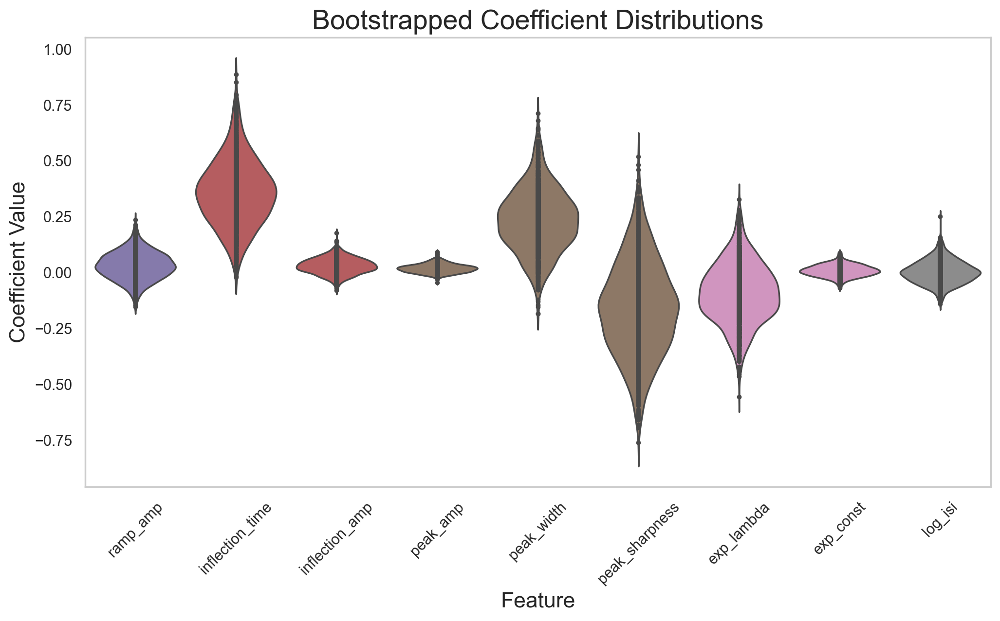

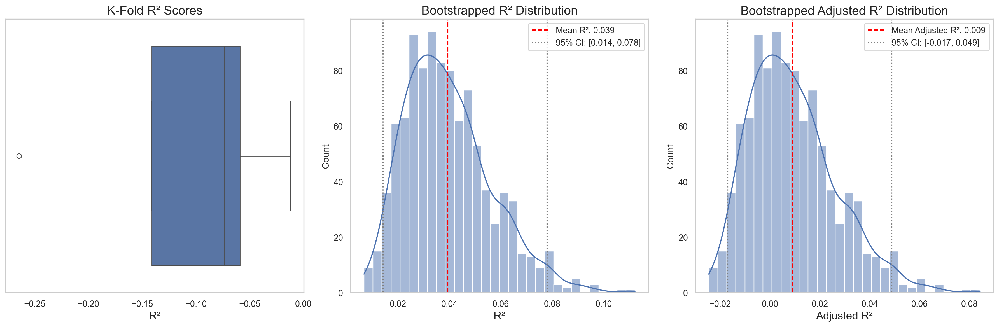


Mean Adjusted R-squared (Bootstrapped): 0.009
95% CI for Adjusted R-squared: [-0.01700722  0.04884245]


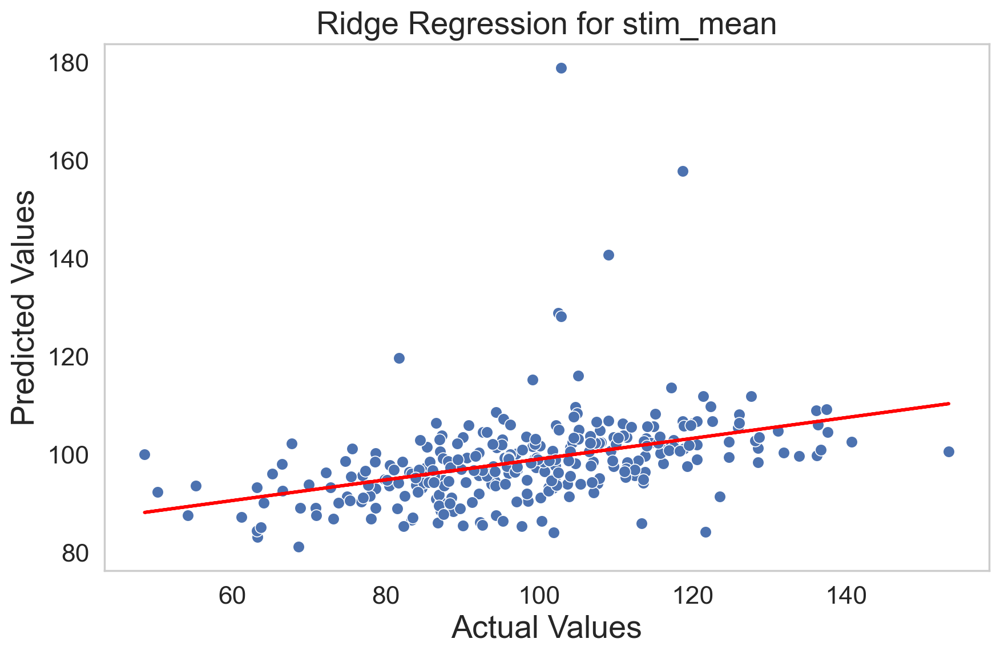

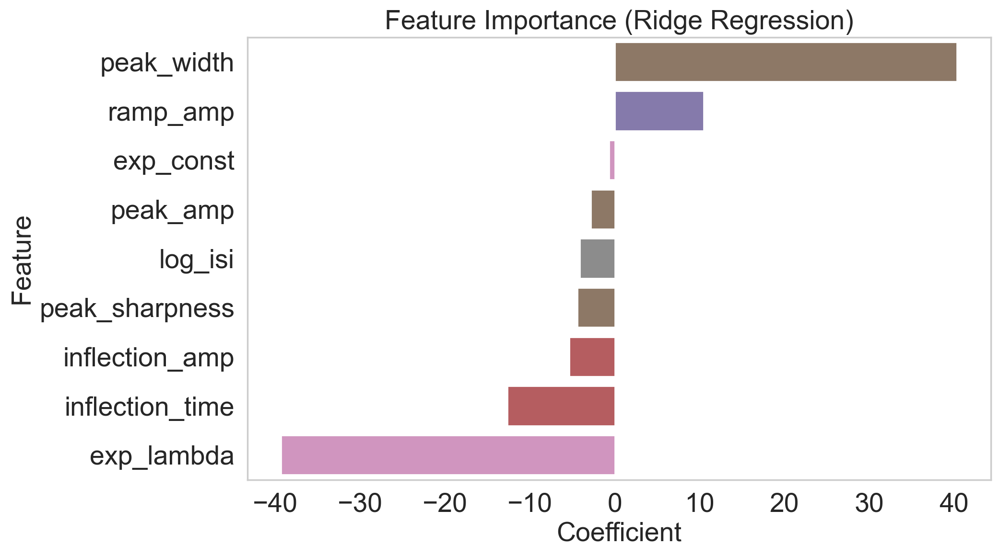


Significant Features (p < 0.05):
           Feature  Coefficient   CI Lower   CI Upper        p-value
4       peak_width    40.333599  28.496823  49.889320   0.000000e+00
0         ramp_amp    10.495930   5.957108  14.881307   0.000000e+00
7        exp_const    -0.681655  -2.603647   1.216322   2.108686e-88
3         peak_amp    -2.800437  -5.248319  -1.534429   0.000000e+00
8          log_isi    -4.129647  -7.247282  -0.822371   0.000000e+00
5   peak_sharpness    -4.413468 -21.239275  10.080397   5.676978e-60
2   inflection_amp    -5.327512  -9.108896  -2.915750   0.000000e+00
1  inflection_time   -12.661990 -25.297003   4.948164  3.429658e-246
6       exp_lambda   -39.335696 -49.296718 -27.020236   0.000000e+00


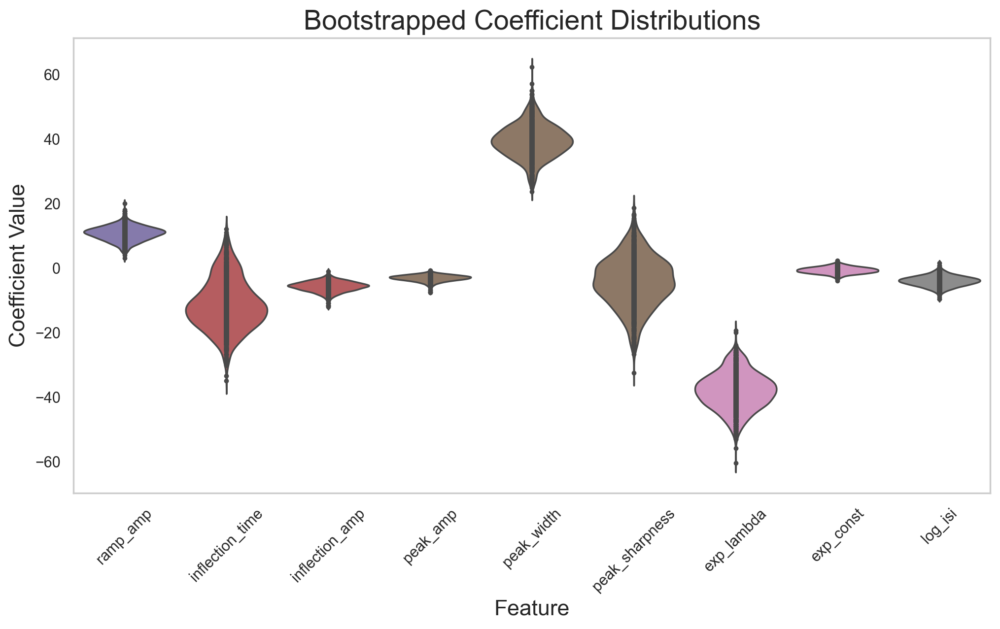

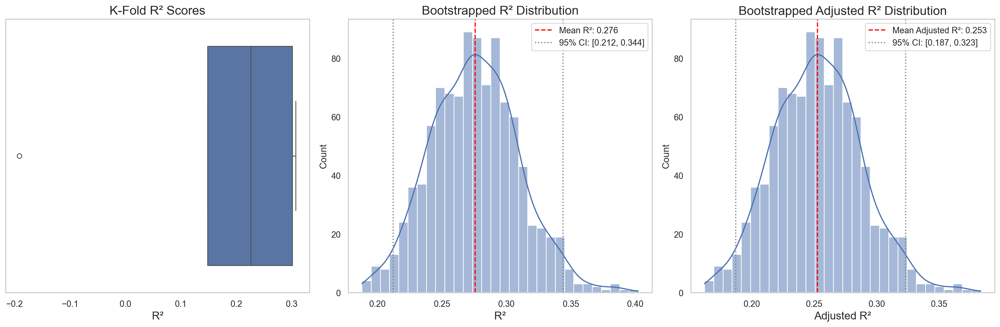


Mean Adjusted R-squared (Bootstrapped): 0.253
95% CI for Adjusted R-squared: [0.18721044 0.32321301]


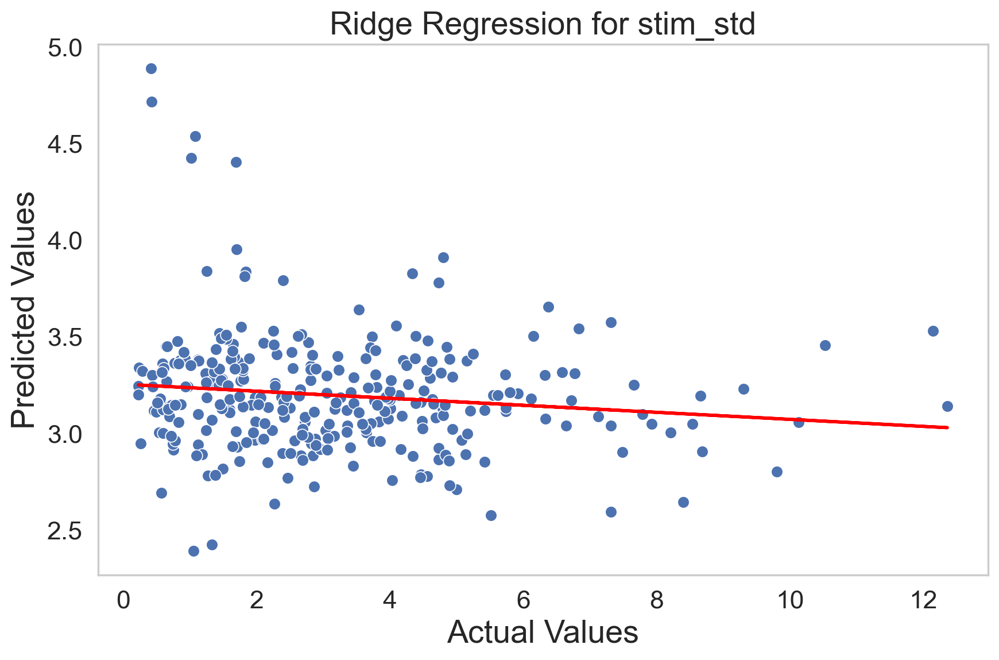

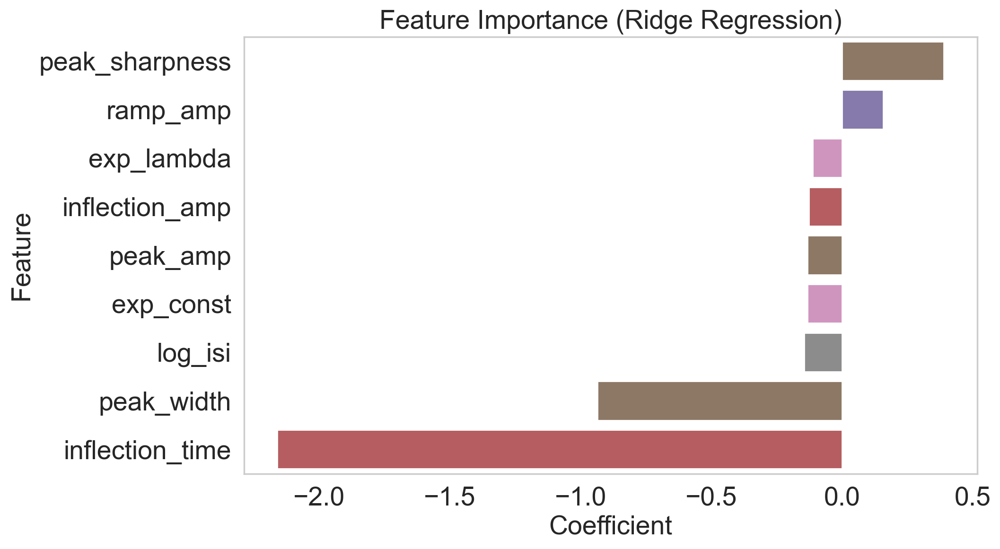


Significant Features (p < 0.05):
           Feature  Coefficient  CI Lower  CI Upper        p-value
5   peak_sharpness     0.389278 -1.569540  2.302080   2.189107e-32
0         ramp_amp     0.158025 -0.520582  0.769200   3.003040e-45
2   inflection_amp    -0.126975 -0.518991  0.234317   4.194290e-93
3         peak_amp    -0.131538 -0.387376  0.053346  7.226163e-212
7        exp_const    -0.132424 -0.426270  0.142124  2.453419e-131
8          log_isi    -0.144225 -0.680738  0.281669   1.600513e-85
4       peak_width    -0.935064 -2.207843  0.230008  1.539562e-261
1  inflection_time    -2.160617 -3.546887 -0.744528   0.000000e+00


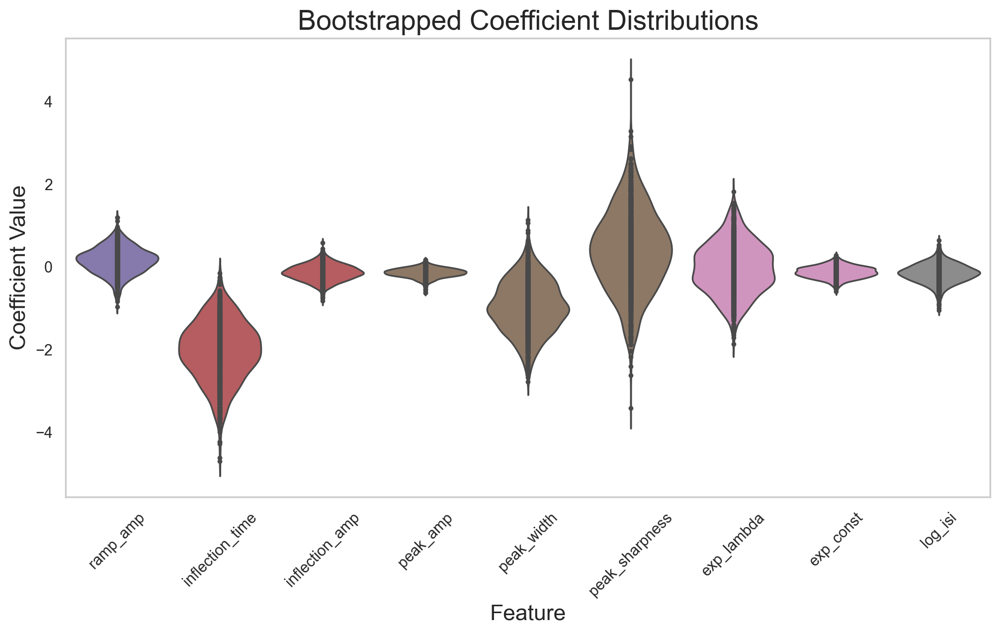

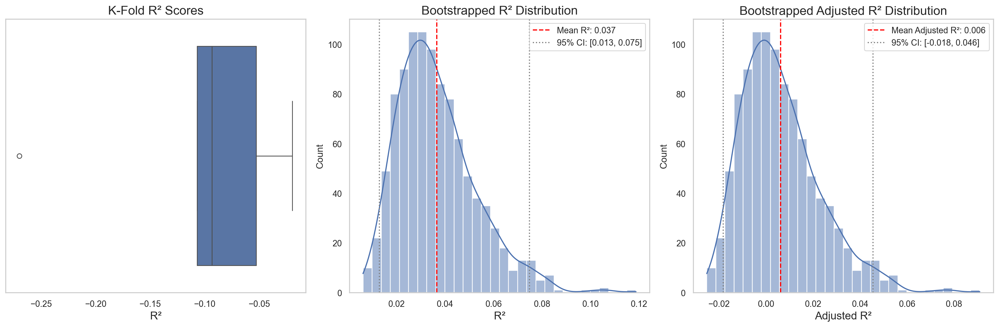


Mean Adjusted R-squared (Bootstrapped): 0.006
95% CI for Adjusted R-squared: [-0.01826615  0.04552217]
average rsq stim mean linear regression model cv:  0.2755451096178733
std rsq stim mean linear regression model cv:  0.034024479154386826


In [29]:
for stim_feature in ['stim_exp', 'stim_mean', 'stim_std']:
    data = df_pink.dropna(subset=[stim_feature])
    y = data[stim_feature]
    plot_ridge_results(y, ridge_results_dict[stim_feature], title=f"Ridge Regression for {stim_feature}")

average_rsq_stim_mean_cv = ridge_results_dict['stim_mean']['r2_mean']
std_rsq_stim_mean_cv = np.std(ridge_results_dict['stim_mean']['bootstrapped_r2'])
print("average rsq stim mean linear regression model cv: ", str(average_rsq_stim_mean_cv))
print("std rsq stim mean linear regression model cv: ", str(std_rsq_stim_mean_cv))

#### Ridge regression: predicting log ISI from three feature sets

Three models: (1) spike waveform features only, (2) spike + stimulus features, (3) stimulus features only. This decomposition shows how much of firing rate predictability comes from waveform shape alone, and how much additional gain comes from knowing the stimulus directly.

In [30]:
#### Only features

Cross-validated R-squared scores: [ 0.35028361  0.25728942 -0.11390896  0.06154199  0.02841016]
Average R-squared: 0.117 ± 0.166
Adjusted R-squared scores: [ 0.33036894  0.23452435 -0.14805176  0.032777   -0.00137037]
Average Adjusted R-squared: 0.090 ± 0.171


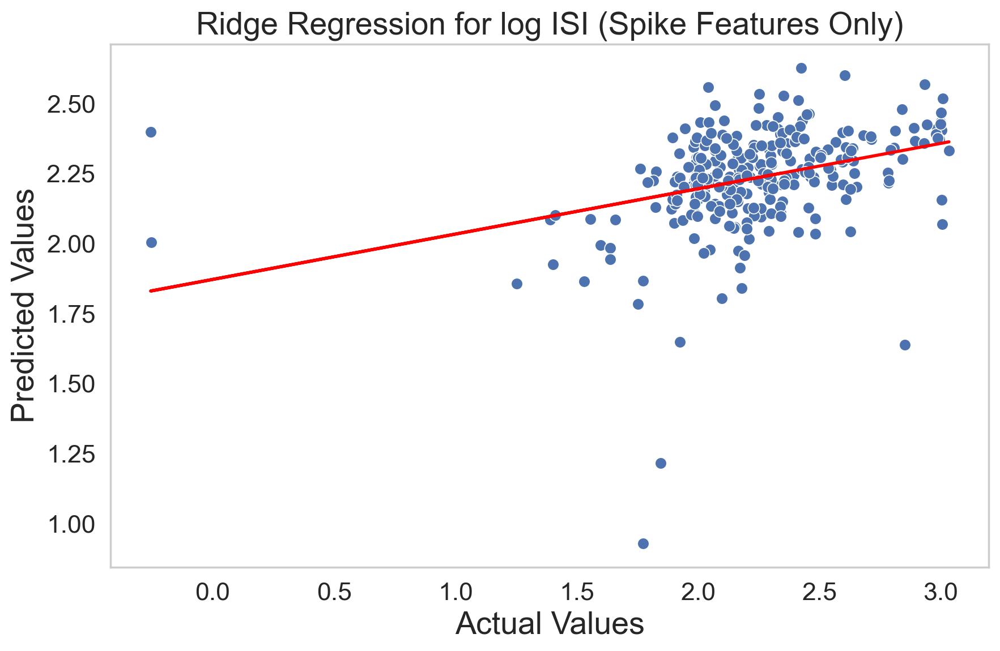

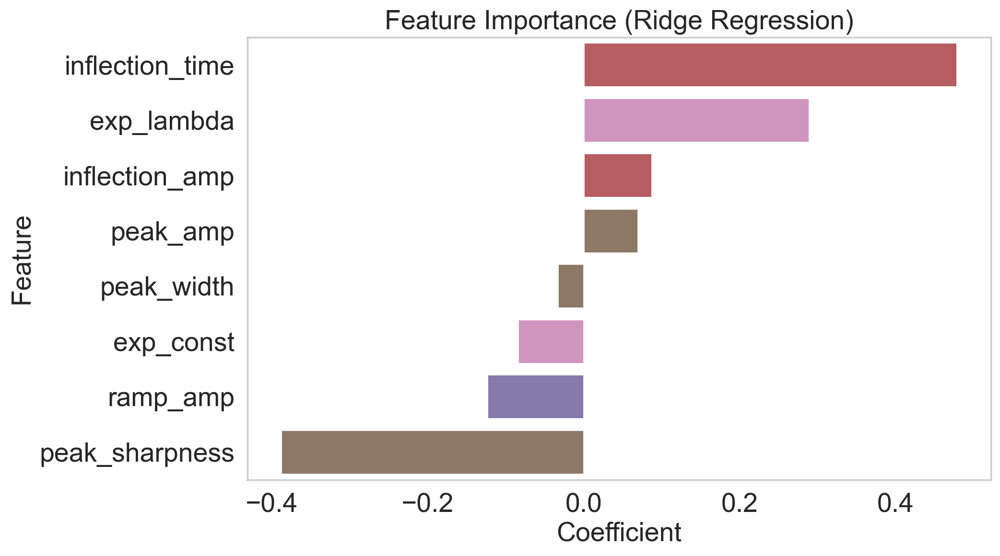


Significant Features (p < 0.05):
           Feature  Coefficient  CI Lower  CI Upper        p-value
1  inflection_time     0.478524  0.076803  0.844479   0.000000e+00
6       exp_lambda     0.289092 -0.006384  0.533221   0.000000e+00
2   inflection_amp     0.087110  0.025595  0.159761   0.000000e+00
3         peak_amp     0.069205  0.030075  0.127466   0.000000e+00
4       peak_width    -0.032958 -0.259221  0.185961   1.317112e-29
7        exp_const    -0.084328 -0.117731 -0.050693   0.000000e+00
0         ramp_amp    -0.123688 -0.222936 -0.027556   0.000000e+00
5   peak_sharpness    -0.388100 -0.853643  0.041369  5.564550e-274


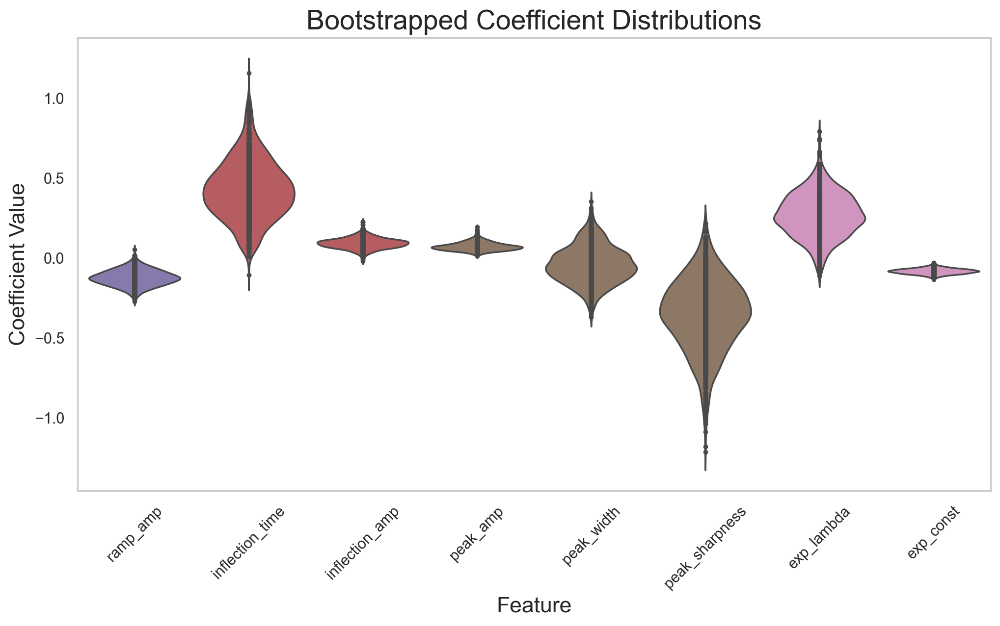

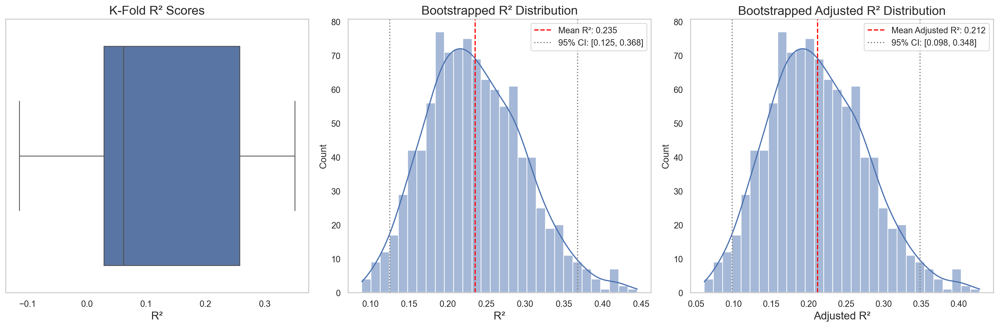


Mean Adjusted R-squared (Bootstrapped): 0.212
95% CI for Adjusted R-squared: [0.09805154 0.34815456]


In [31]:
X_spike_only = df_pink_filtered.drop(columns=['log_isi', 'stim_exp', 'stim_mean', 'stim_std'])
y_log_isi = df_pink_filtered['log_isi']
ridge_results_m1 = run_ridge_regression_kfold(X_spike_only, y_log_isi)
plot_ridge_results(y_log_isi, ridge_results_m1, title="Ridge Regression for log ISI (Spike Features Only)")

In [32]:
average_rsq_stim_mean_cv_m1 = ridge_results_m1['r2_mean']
adjusted_r_squared_m1 = ridge_results_m1['adjusted_r2_mean']
print("average rsq linear regression model cv (M1): ", str(average_rsq_stim_mean_cv_m1))
print("adjusted rsq linear regression model cv (M1): ", str(adjusted_r_squared_m1))

average rsq linear regression model cv (M1):  0.23512381715905611
adjusted rsq linear regression model cv (M1):  0.21167933645895057


##### Model 2: spike features + stimulus mean

Cross-validated R-squared scores: [ 0.34005775  0.24196464 -0.07704046  0.06226292  0.02493555]
Average R-squared: 0.118 ± 0.151
Adjusted R-squared scores: [ 0.31192068  0.2096453  -0.12296079  0.02228188 -0.01663696]
Average Adjusted R-squared: 0.081 ± 0.158


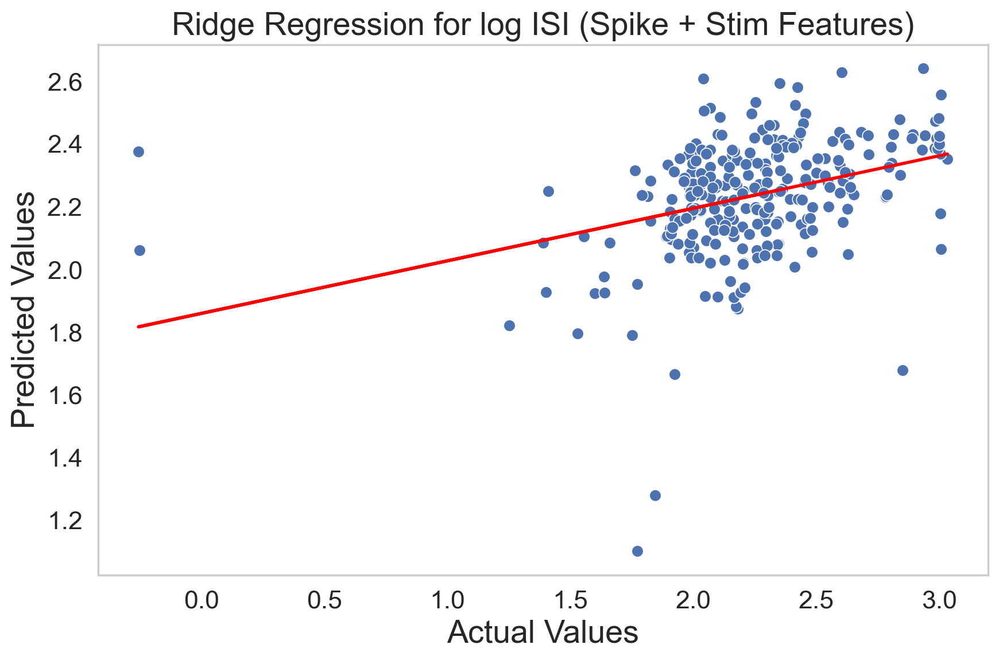

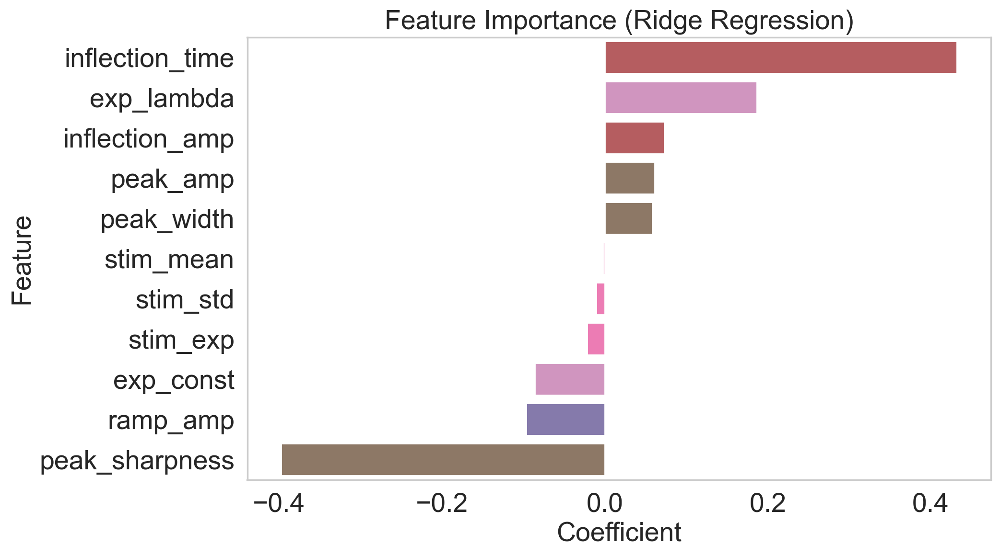


Significant Features (p < 0.05):
            Feature  Coefficient  CI Lower  CI Upper        p-value
4   inflection_time     0.432047  0.044574  0.787562   0.000000e+00
9        exp_lambda     0.186805 -0.052857  0.411508  1.980392e-240
5    inflection_amp     0.072838  0.010310  0.154299   0.000000e+00
6          peak_amp     0.061045  0.018611  0.120084   0.000000e+00
7        peak_width     0.058078 -0.143909  0.255130   1.051457e-45
1         stim_mean    -0.002569 -0.005407  0.000380  1.046156e-301
2          stim_std    -0.010440 -0.044735  0.016547   1.717610e-98
0          stim_exp    -0.021650 -0.197200  0.126937   1.272090e-22
10        exp_const    -0.086274 -0.118995 -0.048142   0.000000e+00
3          ramp_amp    -0.096737 -0.205971 -0.004441   0.000000e+00
8    peak_sharpness    -0.397481 -0.899497  0.058071  1.229318e-254


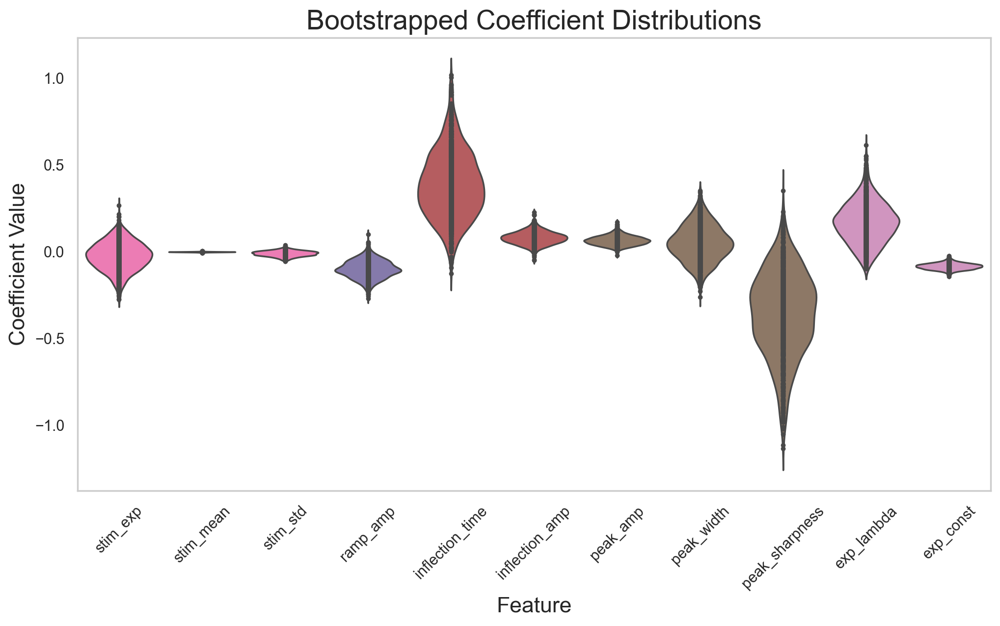

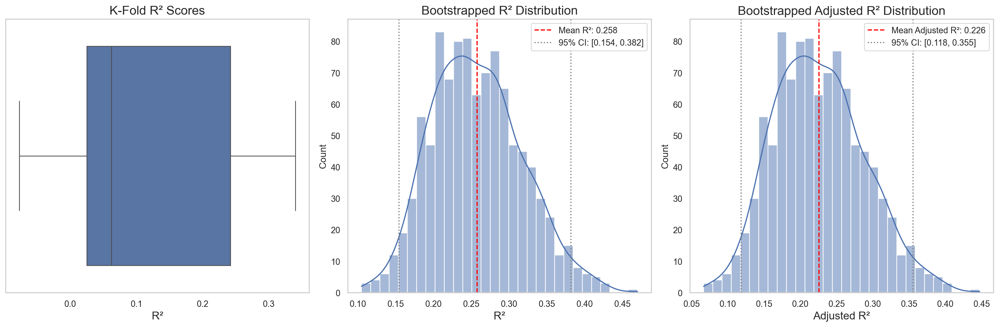


Mean Adjusted R-squared (Bootstrapped): 0.226
95% CI for Adjusted R-squared: [0.11839997 0.35523142]


In [33]:
X_spike_stim = df_pink_filtered.drop(columns=['log_isi'])
ridge_results_m2 = run_ridge_regression_kfold(X_spike_stim, y_log_isi)
plot_ridge_results(y_log_isi, ridge_results_m2, title="Ridge Regression for log ISI (Spike + Stim Features)")

In [34]:
average_rsq_stim_mean_cv_m2 = ridge_results_m2['r2_mean']
adjusted_r_squared_m2 = ridge_results_m2['adjusted_r2_mean']
print("average rsq linear regression model cv (M2): ", str(average_rsq_stim_mean_cv_m2))
print("adjusted rsq linear regression model cv (M2): ", str(adjusted_r_squared_m2))

average rsq linear regression model cv (M2):  0.2575015309568178
adjusted rsq linear regression model cv (M2):  0.22584461948598447


##### Model 3: stimulus mean only

Cross-validated R-squared scores: [ 0.02868431 -0.04348395  0.09546989  0.01792109 -0.10129339]
Average R-squared: -0.001 ± 0.067
Adjusted R-squared scores: [ 0.01772962 -0.05525256  0.08526842  0.00684501 -0.11371399]
Average Adjusted R-squared: -0.012 ± 0.068


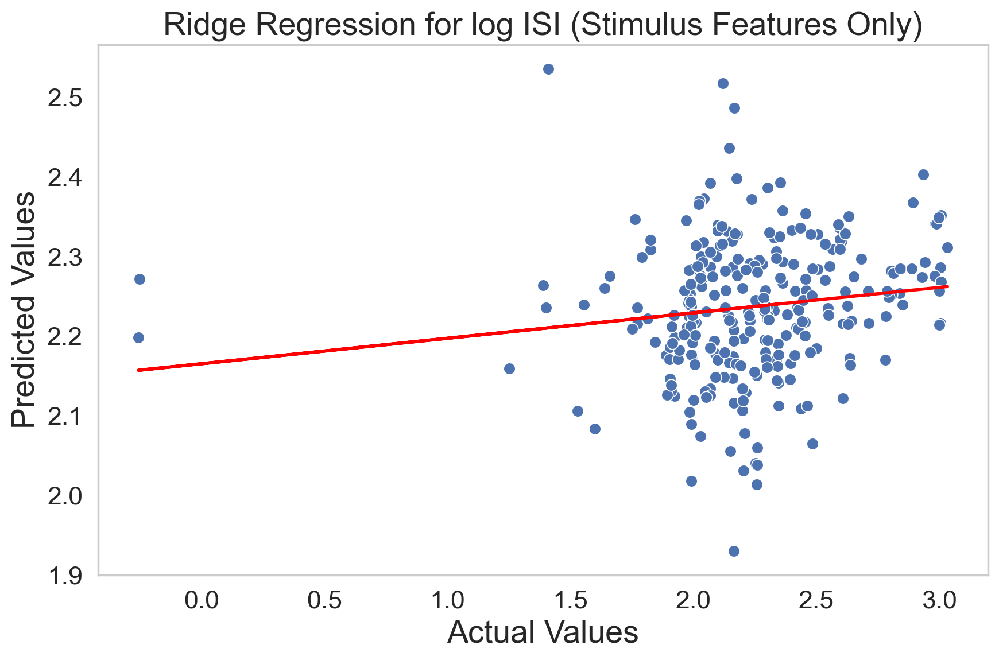

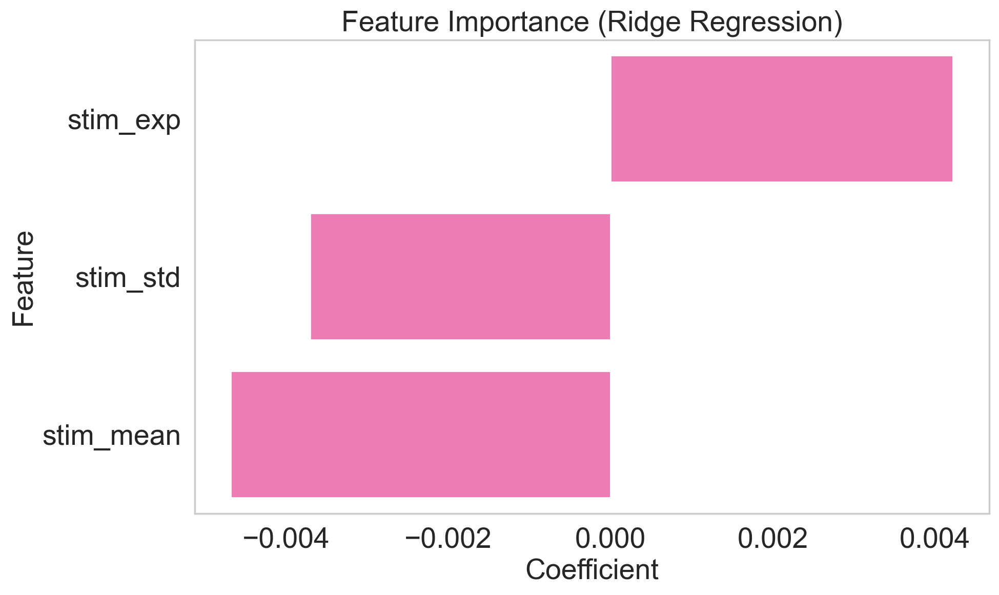


Significant Features (p < 0.05):
     Feature  Coefficient  CI Lower  CI Upper       p-value
2   stim_std    -0.003705 -0.040138  0.026957  3.850584e-19
1  stim_mean    -0.004681 -0.007523 -0.002053  0.000000e+00


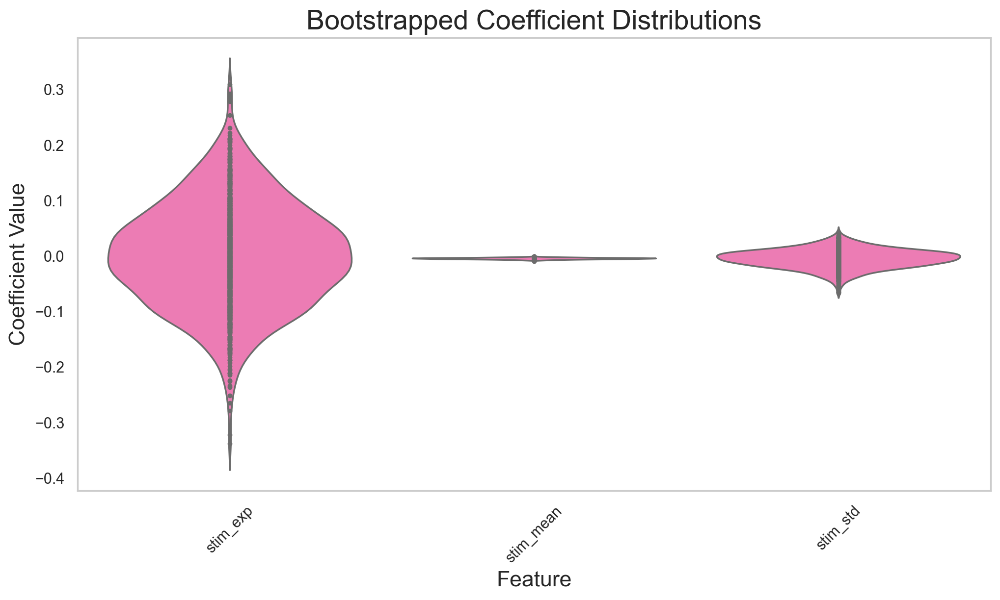

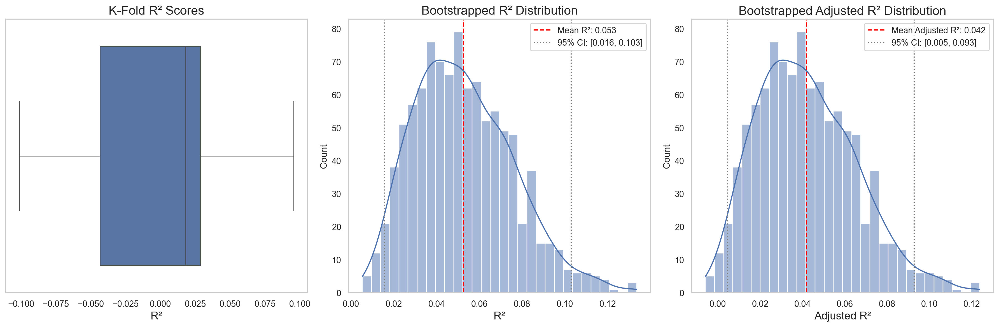


Mean Adjusted R-squared (Bootstrapped): 0.042
95% CI for Adjusted R-squared: [0.00458862 0.09279999]


In [35]:
X_stim_only = df_pink_filtered[['stim_exp', 'stim_mean', 'stim_std']]
ridge_results_m3 = run_ridge_regression_kfold(X_stim_only, y_log_isi)
plot_ridge_results(y_log_isi, ridge_results_m3, title="Ridge Regression for log ISI (Stimulus Features Only)")

In [36]:
average_rsq_stim_mean_cv_m3 = ridge_results_m3['r2_mean']
adjusted_r_squared_m3 = ridge_results_m3['adjusted_r2_mean']
print("average rsq linear regression model cv (M3): ", str(average_rsq_stim_mean_cv_m3))
print("adjusted rsq linear regression model cv (M3): ", str(adjusted_r_squared_m3))

average rsq linear regression model cv (M3):  0.05256541467802014
adjusted rsq linear regression model cv (M3):  0.04188006221198277


#### R² comparison: actual vs adjusted across the three models

Bar plot of cross-validated R² (raw and adjusted) for all three ISI prediction models. Adjusted R² penalizes model complexity — comparing adjusted values across models of different feature counts gives a fair assessment of which feature set genuinely improves prediction beyond what model size alone would achieve.

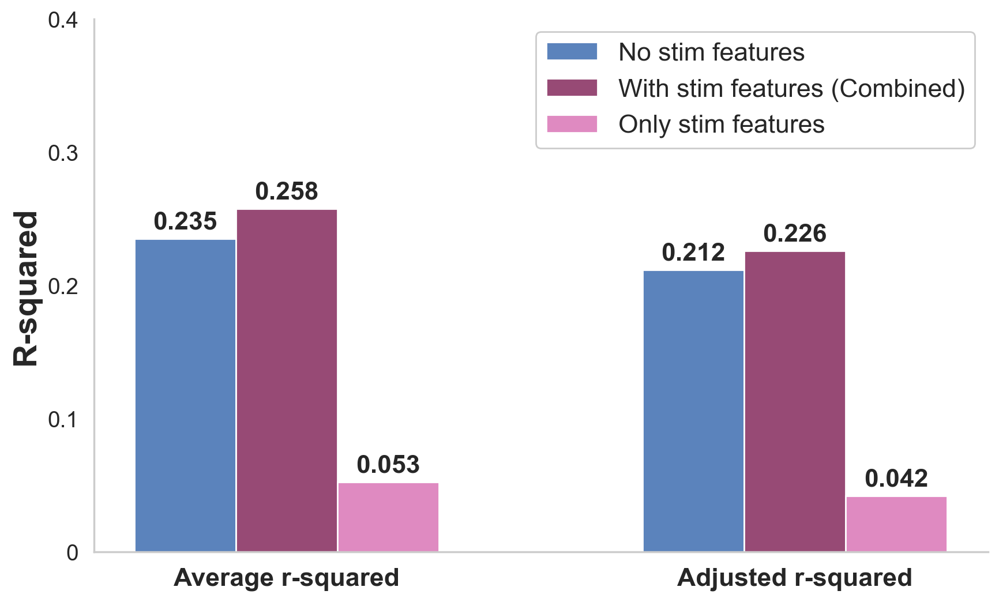

In [37]:
plot_r2_comparison(ridge_results_m1, ridge_results_m2, ridge_results_m3)